# Agent-Specific Evaluation Notebook of the ClinFlowAgent

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from sklearn.metrics import roc_auc_score, auc, precision_recall_curve

project_root = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
sys.path.append(project_root)
from src.util.data_util import (
    get_all_feature_groups,
    features_dyn_sets_titles_dict,
)

## Setup and Configuration

In [2]:
# Set paths to pre-processed CSVs
metadata_path = os.path.join("./notebook_output/postprocessed_data", "pulse_metadata.csv")
metrics_path = os.path.join("./notebook_output/postprocessed_data", "pulse_metrics.csv")
metrics_op_path = os.path.join("./notebook_output/postprocessed_data", "pulse_metrics_operational.csv")

# Load metadata and metrics
df_metadata = pd.read_csv(metadata_path)
print(f"Loaded metadata: {df_metadata.shape}")

# Load performance metrics with and without subgroups
df_metrics_subgroup = pd.read_csv(metrics_path)
print(f"Loaded metrics with subgroups: {df_metrics_subgroup.shape}")

df_metrics = df_metrics_subgroup[
    df_metrics_subgroup["subgroup_type"] == "Overall"
].copy()
df_metrics = df_metrics.drop(columns=["subgroup_type", "subgroup_value"])
print(f"Loaded metrics without subgroups: {df_metrics.shape}")

# Load operational metrics
df_metrics_op = pd.read_csv(metrics_op_path)
print(f"Loaded operational metrics: {df_metrics_op.shape}")


# Split all loaded dataframes into _agents and _benchmark
def split_agents_benchmark(df):
    # Always include convML and convDL
    base = df[(df["model_type"] == "convML") | (df["model_type"] == "convDL")]
    # _agents: add is_agent == True
    agents = pd.concat(
        [base, df[df["is_agent"] == True]], ignore_index=True
    ).drop_duplicates()
    # _benchmark: add is_agent == False
    benchmark = pd.concat(
        [base, df[df["is_agent"] == False]], ignore_index=True
    ).drop_duplicates()
    return agents, benchmark


# Split all loaded dataframes into _agents and _benchmark
def split_agents_benchmark_op(df):
    # Always include convML and convDL
    base = df[(df["model_type"] == "convML") | (df["model_type"] == "convDL")]
    # _agents: include convML/convDL plus all rows where is_agent is True or 'all' (as string)
    agents = pd.concat(
        [base, df[df["is_agent"].isin(["True", "all"])]], ignore_index=True
    ).drop_duplicates()
    # _benchmark: include convML/convDL plus all rows where is_agent is False or 'all' (as string)
    benchmark = pd.concat(
        [base, df[df["is_agent"].isin(["False", "all"])]], ignore_index=True
    ).drop_duplicates()
    return agents, benchmark


df_metadata_agents, df_metadata_benchmark = split_agents_benchmark(df_metadata)
df_metrics_subgroup_agents, df_metrics_subgroup_benchmark = split_agents_benchmark(
    df_metrics_subgroup
)
df_metrics_agents, df_metrics_benchmark = split_agents_benchmark(df_metrics)
df_metrics_op_agents, df_metrics_op_benchmark = split_agents_benchmark_op(df_metrics_op)
# Drop specified columns from df_metrics_op_benchmark
df_metrics_op_benchmark = df_metrics_op_benchmark.drop(
    columns=[
        "avg_step_tokenization_time",
        "avg_step_inference_time",
        "avg_step_input_tokens",
        "avg_step_output_tokens",
    ],
    errors="ignore",
)

print(
    f"df_metadata_agents: {df_metadata_agents.shape}, df_metadata_benchmark: {df_metadata_benchmark.shape}"
)
print(
    f"df_metrics_subgroup_agents: {df_metrics_subgroup_agents.shape}, df_metrics_subgroup_benchmark: {df_metrics_subgroup_benchmark.shape}"
)
print(
    f"df_metrics_agents: {df_metrics_agents.shape}, df_metrics_benchmark: {df_metrics_benchmark.shape}"
)
print(
    f"df_metrics_op_agents: {df_metrics_op_agents.shape}, df_metrics_op_benchmark: {df_metrics_op_benchmark.shape}"
)

/var/folders/r1/8n2p36gx2ydfw7wf826zxyh00000gn/T/ipykernel_56609/595344355.py:7: DtypeWarning: Columns (3,16,20,27,28,29,30,31,33,34,35,36,43,44,47,48,49,50,51,52,53,54,55,56,61,67,70,76,77,78,80,81,83,84,91,92,93) have mixed types. Specify dtype option on import or set low_memory=False.
  df_metadata = pd.read_csv(metadata_path)


Loaded metadata: (1062044, 96)
Loaded metrics with subgroups: (5704, 25)
Loaded metrics without subgroups: (612, 23)
Loaded operational metrics: (837, 22)
df_metadata_agents: (851698, 96), df_metadata_benchmark: (247480, 96)
df_metrics_subgroup_agents: (2856, 25), df_metrics_subgroup_benchmark: (3352, 25)
df_metrics_agents: (306, 23), df_metrics_benchmark: (360, 23)
df_metrics_op_agents: (385, 22), df_metrics_op_benchmark: (463, 18)


In [3]:
# Global output directory for all visualizations
OUTPUT_BASE_DIR = os.path.join(".", "notebook_output", "pulse_agents_clinflowagent")

TASK_MAPPING = {
    "mortality": ("Mortality", {"case": "#D14E70", "control": "#F0B0C0"}),  # Raspberry
    "aki": ("AKI", {"case": "#3A78B5", "control": "#A0D0F0"}),  # Blue
    "sepsis": ("Sepsis", {"case": "#F9C27B", "control": "#FFE6A7"}),  # Amber/Gold
}

DATASET_MAPPING = {
    "hirid": ("HiRID", "#793FBB"),  # Purple
    "miiv": ("MIMIC-IV", "#17AB6F"),  # Green
    "eicu": ("eICU", "#FC8D5F"),  # Orange
}
MODEL_MAPPING = {
    # convML: slightly darker, more prominent blues (light to dark)
    "RandomForest": "#c9daf6",  # light blue, slightly darker and bluer
    "XGBoost": "#4f8ad1",  # deeper blue, more saturated
    # convDL: slightly darker, more prominent greens (light to dark)
    "CNN": "#c6eedb",  # light mint green, slightly darker
    "InceptionTime": "#7fd6b1",  # medium mint green, slightly darker
    "LSTM": "#3ca97d",  # deeper green, more saturated
    "GRU": "#217a5a",  # even deeper green
    # LLMs: vivid, distinct, friendly (legend only)
    "OpenAI-o3": "#ff66c3",  # vivid magenta (first agent color in LLM_COLOR_FAMILIES)
    "Claude-Sonnet-4": "#1080e2",  # vivid blue (first agent color in LLM_COLOR_FAMILIES)
    "Grok-4": "#b44fd1",  # vivid purple (first agent color in LLM_COLOR_FAMILIES)
    "Gemini-2.5-Pro": "#8be600",  # vivid lime green (first agent color in LLM_COLOR_FAMILIES)
    "Gemini-2.5-Flash": "#ff7c1a",  # vivid gold (first agent color in LLM_COLOR_FAMILIES)
    "Llama-3.1-8B-Instruct": "#4cb0c3",  # vivid turquoise (first agent color in LLM_COLOR_FAMILIES)
    "Deepseek-R1-Distill-Llama-8B": "#ffa233",  # vivid orange (first agent color in LLM_COLOR_FAMILIES)
    "Mistral-7B-Instruct-v0.3": "#8f5ad8",  # vivid violet (first agent color in LLM_COLOR_FAMILIES)
    "Gemma-3-4B-it": "#00e699",  # vivid mint green (first agent color in LLM_COLOR_FAMILIES)
    "MedGemma-4B-it": "#c2338c",  # vivid magenta (first agent color in LLM_COLOR_FAMILIES)
}

PROMPTING_ID_MAPPING = {
    "Aggregation": "#1f77b4",  # Vivid Blue
    "Zero-Shot": "#ff7f0e",  # Vibrant Orange
    "One-Shot": "#9cf177",  # Modern Purple
    "Few-Shot (3)": "#fbe844",  # Bold Red
    "CoT": "#2ca02c",  # Fresh Green
    "SumAgent": "#ebb128",  # Playful Pink
    "ColAgent": "#b141e9",  # Lively Cyan
    "ClinFlowAgent": "#36eaab",  # Warm Brown
    "HybReAgent": "#f13636",  # Energetic Yellow-Green
}

CONVML_MODELS = ["RandomForest", "XGBoost"]
CONVDL_MODELS = ["CNN", "InceptionTime", "GRU", "LSTM"]
LLM_MODELS = [
    "OpenAI-o3",
    "Claude-Sonnet-4",
    "Grok-4",
    "Gemini-2.5-Pro",
    "Gemini-2.5-Flash",
    "Llama-3.1-8B-Instruct",
    "Deepseek-R1-Distill-Llama-8B",
    "Mistral-7B-Instruct-v0.3",
    "Gemma-3-4B-it", 
    "MedGemma-4B-it",
]

SUBGROUP_MAPPING = {
    "Sex": {"Male": "#1f4e79", "Female": "#c5282f"},  # Dark blue, Dark red
    "Age": {
        "18-65 Years": "#ddbf94",  # Light beige
        "65-75 Years": "#c19a6b",  # Medium beige
        "75-91 Years": "#8b7355",  # Dark beige
    },
    "BMI": {
        "BMI < 18.5 kg/m2": "#b8b8b8",  # Light silver
        "BMI 18.5-25 kg/m2": "#9d9d9d",  # Medium light silver
        "BMI 25-30 kg/m2": "#808080",  # Medium dark silver
        "BMI > 30 kg/m2": "#2c3539",  # Dark gunmetal
    },
}

METRICS_LIST = [
    "AUROC",
    "AUPRC",
    "Normalized AUPRC",
    "Min(+P, Se)",
    "Sensitivity (Recall)",
    "Specificity",
    "Precision",
    "F1 Score",
    "Accuracy",
    "Balanced Accuracy",
    "MCC",
    "Cohen's Kappa",
]

LLM_ALL_PROMPTING_IDS = sorted(
    x
    for x in df_metadata.loc[
        ~df_metadata["model_prompting_id"].isin(CONVML_MODELS + CONVDL_MODELS),
        "model_prompting_id",
    ].unique()
    if isinstance(x, str)
)

# Define agentic prompting methods
AGENTIC_PROMPTING_IDS = [
    "SumAgent",
    "ColAgent",
    "ClinFlowAgent",
    "HybReAgent",
]

# Define standard prompting methods
STANDARD_PROMPTING_IDS = [
    "Aggregation",
    "Zero-Shot",
    "One-Shot",
    "Few-Shot (3)",
    "CoT",
]

LLM_COLOR_FAMILIES = {
    "OpenAI-o3": {
        "standard_prompting": [
            "#fff0fa",  # 1 - very pale pink
            "#ffd6f2",  # 2 - light bubblegum
            "#ffb3e6",  # 3 - pastel bubblegum
            "#ff99db",  # 4 - soft bubblegum
            "#ff7fcf",  # 5 - bubblegum
        ],  # Pastel magenta to vivid pink
        "agents": [
            "#ff66c3",  # 6 - vivid bubblegum
            "#ff4db8",  # 7 - strong bubblegum
            "#ff33ac",  # 8 - deep bubblegum
            "#ff199f",  # 9 - deepest bubblegum
        ],  # Deeper magenta to lighter berry
    },
    "Claude-Sonnet-4": {
        "standard_prompting": [
            "#eaf6ff",
            "#b6dcff",
            "#7fc0ff",
            "#4da3ff",
            "#1987ff",
        ],  # Pastel blue to vivid azure
        "agents": [
            "#1080e2",
            "#0c6cc5",
            "#1152ad",
            "#114d83",
        ],  # Deeper blue to lighter navy
    },
    "Grok-4": {
        "standard_prompting": [
            "#fbe6ff",  # 1 - very light pink-lilac
            "#f3c2fa",  # 2 - pastel pink-lilac
            "#e6a8f7",  # 3 - soft lilac
            "#d98cf0",  # 4 - light magenta-lilac
            "#c96ae6",  # 5 - medium lilac
        ],  # Pastel lilac to vivid purple
        "agents": [
            "#b44fd1",  # 6 - vivid lilac
            "#9443c3",  # 7 - strong blue-violet
            "#7d2ca2",  # 8 - deep blue-violet
            "#61247C",  # 9 - darkest, but lighter than pure indigo
        ],  # Deeper purple to lighter violet
    },
    "Gemini-2.5-Pro": {
        "standard_prompting": [
            "#f7ffe0",  # 1 - very pale lime
            "#eaffb3",  # 2 - light lime
            "#d4ff66",  # 3 - pastel lime
            "#baff33",  # 4 - soft lime
            "#a0ff00",  # 5 - vivid lime
        ],  # Pastel green to vivid lime
        "agents": [
            "#8be600",  # 6 - lime green
            "#7acc1a",  # 7 - yellow-green
            "#6ab300",  # 8 - olive-lime
            "#5a9900",  # 9 - darkest, yellowish green
        ],  # Deeper lime/green to lighter green
    },
    "Gemini-2.5-Flash": {
        "standard_prompting": [
            "#fff4e6",  # 1 - very light orange
            "#ffd9b3",  # 2 - light peach
            "#ffc285",  # 3 - soft orange
            "#ffad5c",  # 4 - rich orange
            "#ff9800",  # 5 - vivid orange
        ],  # Pastel yellow to vivid gold
        "agents": [
            "#ff7c1a",  # 6 - deep orange
            "#ff5a36",  # 7 - orange-red
            "#e64a19",  # 8 - strong reddish orange
            "#e65c00",
        ],  # Deeper gold to lighter orange-brown
    },
    "Llama-3.1-8B-Instruct": {
        "standard_prompting": [
            "#e0ffff",  # 1 - very light aqua
            "#b3eaf2",  # 2 - lighter aqua
            "#99dbe6",  # 3 - light pastel aqua
            "#7fcddb",  # 4 - pastel aqua
            "#66becf",  # 5 - soft aqua
        ],  # Pastel aqua to vivid turquoise
        "agents": [
            "#4cb0c3",  # 6 - medium aqua
            "#3391a7",  # 7 - deeper aqua
            "#2a7c8c",  # 8 - dark teal-blue
            "#2a6a7c",  # 9 - darkest, deep blue-teal
        ],  # Deeper turquoise to lighter teal
    },
    "Deepseek-R1-Distill-Llama-8B": {
        "standard_prompting": [
            "#fff3e0",  # 1 - very light peach
            "#ffe3c2",  # 2 - light cream
            "#ffd39f",  # 3 - pale yellow-orange
            "#ffc278",  # 4 - soft yellow-orange
            "#ffb34d",  # 5 - light amber
        ],  # Pastel peach to vivid orange
        "agents": [
            "#ffa233",  # 6 - amber
            "#e88c1a",  # 7 - brownish amber
            "#c97a1a",  # 8 - brown-orange
            "#be7835",  # 9 - brown
        ],  # Deeper orange to lighter brown
    },
    "Mistral-7B-Instruct-v0.3": {
        "standard_prompting": [
            "#f6efff",  # 1 - very light lavender
            "#e3d1fa",  # 2 - pale lavender
            "#d1b3f6",  # 3 - light pastel purple
            "#be95ea",  # 4 - soft purple
            "#a97fdc",  # 5 - medium purple
        ],  # Pastel lilac to vivid violet
        "agents": [
            "#8f5ad8",  # 6 - vivid purple
            "#7a3fc7",  # 7 - strong purple
            "#6a1bb1",  # 8 - deep purple
            "#502491",  # 9 - darkest, but not black
        ],  # Deeper violet to lighter purple
    },
    "Gemma-3-4B-it": {
        "standard_prompting": [
            "#e6fff7",  # 1 - very pale blue-green
            "#b3ffe6",  # 2 - light blue-green
            "#80ffd1",  # 3 - pastel blue-green
            "#4dffbe",  # 4 - soft blue-green
            "#1affaa",  # 5 - vivid blue-green
        ],  # Pastel mint to vivid green
        "agents": [
            "#00e699",  # 6 - cool green
            "#00cc88",  # 7 - blueish green
            "#00b377",  # 8 - deep blue-green
            "#009966",  # 9 - darkest, blueish green
        ],  # Deeper mint/green to lighter green
    },
    "MedGemma-4B-it": {
        "standard_prompting": [
            "#fbe6f6",  # 1 - very pale berry
            "#f5c2e3",  # 2 - light berry
            "#ee99cc",  # 3 - pastel berry
            "#e673b8",  # 4 - soft berry
            "#d94da3",  # 5 - berry
        ],  # Pastel pink to vivid magenta
        "agents": [
            "#c2338c",  # 6 - vivid berry
            "#a61a70",  # 7 - strong berry
            "#8c005a",  # 8 - deep berry
            "#66003f",  # 9 - darkest berry
        ],  # Deeper magenta to lighter pink/purple
    },
}

# Create unified model-prompting mapping
MODEL_PROMPTING_ID_MAPPING = {}

# Add convML and convDL models (unchanged)
for model in CONVML_MODELS + CONVDL_MODELS:
    MODEL_PROMPTING_ID_MAPPING[model] = MODEL_MAPPING[model]

# Add LLM models with integrated color schemes
for model, color_family in LLM_COLOR_FAMILIES.items():
    # Assign agent colors
    for i, agent_id in enumerate(AGENTIC_PROMPTING_IDS):
        key = f"{model}, {agent_id}"
        if i < len(color_family["agents"]):
            MODEL_PROMPTING_ID_MAPPING[key] = color_family["agents"][i]
        else:
            # Fallback to cycling through available agent colors
            MODEL_PROMPTING_ID_MAPPING[key] = color_family["agents"][
                i % len(color_family["agents"])
            ]

    # Assign standard prompting colors
    for i, standard_id in enumerate(STANDARD_PROMPTING_IDS):
        key = f"{model}, {standard_id}"
        if i < len(color_family["standard_prompting"]):
            MODEL_PROMPTING_ID_MAPPING[key] = color_family["standard_prompting"][i]
        else:
            # Fallback to cycling through available standard colors
            MODEL_PROMPTING_ID_MAPPING[key] = color_family["standard_prompting"][
                i % len(color_family["standard_prompting"])
            ]

# Function to get model-specific color
def get_model_color(model):
    if model in MODEL_MAPPING:
        # Use the color defined in MODEL_MAPPING for convML/convDL models
        return MODEL_MAPPING[model]

### Agent-specific Metadata Overview

In [4]:
# Filter df_metadata_agents to only include ClinFlowAgent
df_metadata_cwa = df_metadata_agents[df_metadata_agents["prompting_id"] == "ClinFlowAgent"].copy()
print(f"df_metadata_cwa: {df_metadata_cwa.shape}")

# Delete columns that have only missing values
columns_before = df_metadata_cwa.shape[1]
df_metadata_cwa = df_metadata_cwa.dropna(axis=1, how='all')
columns_after = df_metadata_cwa.shape[1]
print(f"Removed {columns_before - columns_after} columns with only missing values")
print(f"df_metadata_cwa after cleanup: {df_metadata_cwa.shape}")

# Comprehensive analysis of df_metadata_cwa characteristics
print("=" * 80)
print("COMPREHENSIVE SUMMARY OF ClinFlowAgent METADATA")
print("=" * 80)

# Basic shape and structure
print(f"\n1. DATASET OVERVIEW")
print(f"   Shape: {df_metadata_cwa.shape[0]} rows × {df_metadata_cwa.shape[1]} columns")
print(f"   Total experiments: {len(df_metadata_cwa)}")

# Column information
print(f"\n2. AVAILABLE COLUMNS")
print(f"   Columns: {list(df_metadata_cwa.columns)}")

# Model distribution
print(f"\n3. MODEL DISTRIBUTION")
if 'model' in df_metadata_cwa.columns:
    model_counts = df_metadata_cwa['model'].value_counts()
    print(f"   Models tested: {len(model_counts)} unique models")
    for model, count in model_counts.items():
        print(f"   - {model}: {count} rows")
else:
    print("   No 'model' column found")

# Task distribution
print(f"\n4. TASK DISTRIBUTION")
if 'task' in df_metadata_cwa.columns:
    task_counts = df_metadata_cwa['task'].value_counts()
    print(f"   Tasks evaluated: {len(task_counts)} unique tasks")
    for task, count in task_counts.items():
        print(f"   - {task}: {count} rows")
else:
    print("   No 'task' column found")

# Dataset distribution
print(f"\n5. DATASET DISTRIBUTION")
if 'dataset' in df_metadata_cwa.columns:
    dataset_counts = df_metadata_cwa['dataset'].value_counts()
    print(f"   Datasets used: {len(dataset_counts)} unique datasets")
    for dataset, count in dataset_counts.items():
        print(f"   - {dataset}: {count} rows")
else:
    print("   No 'dataset' column found")

# Model type distribution
print(f"\n6. MODEL TYPE DISTRIBUTION")
if 'model_type' in df_metadata_cwa.columns:
    model_type_counts = df_metadata_cwa['model_type'].value_counts()
    print(f"   Model types: {len(model_type_counts)} unique types")
    for model_type, count in model_type_counts.items():
        print(f"   - {model_type}: {count} experiments")
else:
    print("   No 'model_type' column found")

# Prompting ID verification
print(f"\n7. PROMPTING METHOD VERIFICATION")
if 'prompting_id' in df_metadata_cwa.columns:
    prompting_counts = df_metadata_cwa['prompting_id'].value_counts()
    print(f"   Prompting methods: {len(prompting_counts)} unique methods")
    for prompting, count in prompting_counts.items():
        print(f"   - {prompting}: {count} experiments")
else:
    print("   No 'prompting_id' column found")

# Agent verification
print(f"\n8. AGENT STATUS VERIFICATION")
if 'is_agent' in df_metadata_cwa.columns:
    agent_counts = df_metadata_cwa['is_agent'].value_counts()
    print(f"   Agent status distribution:")
    for status, count in agent_counts.items():
        print(f"   - is_agent={status}: {count} experiments")
else:
    print("   No 'is_agent' column found")

# Cross-tabulation analysis
print(f"\n9. CROSS-TABULATION ANALYSIS")
if all(col in df_metadata_cwa.columns for col in ['model', 'task', 'dataset']):
    print(f"   Model × Task × Dataset combinations:")
    cross_tab = df_metadata_cwa.groupby(['model', 'task', 'dataset']).size().reset_index(name='count')
    print(f"   Total unique combinations: {len(cross_tab)}")
    
    # Show coverage matrix
    print(f"\n   Coverage by Task and Dataset:")
    coverage = df_metadata_cwa.pivot_table(
        index='task', 
        columns='dataset', 
        values='model', 
        aggfunc='count', 
        fill_value=0
    )
    print(coverage)
    
    print(f"\n   Coverage by Model and Task:")
    model_task_coverage = df_metadata_cwa.pivot_table(
        index='model', 
        columns='task', 
        values='dataset', 
        aggfunc='count', 
        fill_value=0
    )
    print(model_task_coverage)

# Model-prompting ID combinations
print(f"\n10. MODEL-PROMPTING COMBINATIONS")
if 'model_prompting_id' in df_metadata_cwa.columns:
    model_prompting_counts = df_metadata_cwa['model_prompting_id'].value_counts()
    print(f"    Unique model-prompting combinations: {len(model_prompting_counts)}")
    for combo, count in model_prompting_counts.items():
        print(f"    - {combo}: {count} experiments")

# Temporal information (if available)
print(f"\n11. TEMPORAL INFORMATION")
time_columns = [col for col in df_metadata_cwa.columns if any(keyword in col.lower() for keyword in ['time', 'date', 'duration', 'created'])]
if time_columns:
    print(f"    Time-related columns found: {time_columns}")
    for col in time_columns:
        if df_metadata_cwa[col].dtype in ['datetime64[ns]', 'object']:
            try:
                # Try to convert to datetime if not already
                temp_series = pd.to_datetime(df_metadata_cwa[col], errors='coerce')
                if not temp_series.isna().all():
                    print(f"    - {col}: {temp_series.min()} to {temp_series.max()}")
            except:
                print(f"    - {col}: Unable to parse as datetime")
        else:
            print(f"    - {col}: {df_metadata_cwa[col].describe()}")
else:
    print("    No time-related columns found")

# Configuration and parameter information
print(f"\n12. CONFIGURATION PARAMETERS")
config_columns = [col for col in df_metadata_cwa.columns if any(keyword in col.lower() for keyword in ['config', 'param', 'setting', 'seed', 'temperature', 'max_tokens'])]
if config_columns:
    print(f"    Configuration columns found: {config_columns}")
    for col in config_columns:
        unique_vals = df_metadata_cwa[col].nunique()
        if unique_vals <= 10:  # Show all values if few unique
            print(f"    - {col}: {sorted(df_metadata_cwa[col].unique())}")
        else:
            print(f"    - {col}: {unique_vals} unique values, range: {df_metadata_cwa[col].min()} to {df_metadata_cwa[col].max()}")
else:
    print("    No configuration-related columns found")

# File and path information
print(f"\n13. FILE AND PATH INFORMATION")
path_columns = [col for col in df_metadata_cwa.columns if any(keyword in col.lower() for keyword in ['path', 'file', 'dir', 'output'])]
if path_columns:
    print(f"    Path-related columns found: {path_columns}")
    for col in path_columns:
        unique_count = df_metadata_cwa[col].nunique()
        print(f"    - {col}: {unique_count} unique paths")
        if unique_count <= 5:  # Show examples for few paths
            print(f"      Examples: {list(df_metadata_cwa[col].unique()[:3])}")
else:
    print("    No path-related columns found")

# Missing data analysis
print(f"\n14. DATA COMPLETENESS ANALYSIS")
missing_data = df_metadata_cwa.isnull().sum()
missing_percentage = (missing_data / len(df_metadata_cwa)) * 100
print(f"    Columns with missing data:")
for col, missing_count in missing_data[missing_data > 0].items():
    print(f"    - {col}: {missing_count} missing ({missing_percentage[col]:.1f}%)")
if missing_data.sum() == 0:
    print("    No missing data found - dataset is complete!")

# Sample data preview
print(f"\n15. SAMPLE DATA PREVIEW")
print("    First 3 rows:")
print(df_metadata_cwa.head(3).to_string())

# Data types
print(f"\n16. DATA TYPES")
print("    Column data types:")
for col, dtype in df_metadata_cwa.dtypes.items():
    print(f"    - {col}: {dtype}")

# Statistical summary for numerical columns
print(f"\n17. NUMERICAL COLUMNS SUMMARY")
numerical_cols = df_metadata_cwa.select_dtypes(include=[np.number]).columns
if len(numerical_cols) > 0:
    print("    Numerical columns statistics:")
    print(df_metadata_cwa[numerical_cols].describe())
else:
    print("    No numerical columns found")

print(f"\n" + "=" * 80)
print("SUMMARY COMPLETE - Ready for detailed agent evaluation analysis")
print("=" * 80)

df_metadata_cwa: (285866, 96)
Removed 42 columns with only missing values
df_metadata_cwa after cleanup: (285866, 54)
COMPREHENSIVE SUMMARY OF ClinFlowAgent METADATA

1. DATASET OVERVIEW
   Shape: 285866 rows × 54 columns
   Total experiments: 285866

2. AVAILABLE COLUMNS
   Columns: ['model_type', 'model_name', 'is_agent', 'prompting_id', 'task', 'dataset', 'sample_index', 'original_row_index', 'sex', 'age', 'height', 'weight', 'probabilities', 'prediction', 'label', 'Sample ID', 'Step Name', 'Step Number', 'Target Label', 'metadata_patient_age', 'metadata_patient_sex', 'metadata_patient_weight', 'metadata_patient_height', 'metadata_monitoring_hours', 'metadata_total_features_available', 'metadata_data_completeness_score', 'metadata_imputation_percentage', 'metadata_agent_type', 'metadata_sample_start_time', 'System Message', 'Input Prompt', 'Output', 'Predicted Probability', 'Predicted Diagnosis', 'Predicted Explanation', 'Requested Tests', 'Confidence', 'Tokenization Time', 'Inferen

/var/folders/r1/8n2p36gx2ydfw7wf826zxyh00000gn/T/ipykernel_56609/3292031719.py:131: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_series = pd.to_datetime(df_metadata_cwa[col], errors='coerce')


    - Output: 244842 unique paths
    - Output Tokens: 2252 unique paths
    - source_file: 54 unique paths
    - source_file.1: 54 unique paths

14. DATA COMPLETENESS ANALYSIS
    Columns with missing data:
    - probabilities: 37151 missing (13.0%)
    - prediction: 37151 missing (13.0%)
    - metadata_patient_age: 248732 missing (87.0%)
    - metadata_patient_sex: 248732 missing (87.0%)
    - metadata_patient_weight: 248732 missing (87.0%)
    - metadata_patient_height: 248732 missing (87.0%)
    - metadata_monitoring_hours: 248732 missing (87.0%)
    - metadata_total_features_available: 17 missing (0.0%)
    - metadata_data_completeness_score: 248732 missing (87.0%)
    - metadata_imputation_percentage: 248732 missing (87.0%)
    - metadata_agent_type: 248732 missing (87.0%)
    - metadata_sample_start_time: 248732 missing (87.0%)
    - Input Prompt: 37134 missing (13.0%)
    - Output: 37134 missing (13.0%)
    - Predicted Probability: 37151 missing (13.0%)
    - Predicted Diagnosi

# Evaluation and Validation of ClinFlowAgent Behaviour

In [5]:
# Create output directory
os.makedirs(OUTPUT_BASE_DIR, exist_ok=True)
print(f"Analysis output directory: {OUTPUT_BASE_DIR}")

# Data preprocessing for analysis
print("\n" + "="*80)
print("DATA PREPROCESSING FOR ClinFlowAgent ANALYSIS")
print("="*80)

# Clean and prepare the data
df_cwa_clean = df_metadata_cwa.copy()

# Convert Confidence column to numeric (handle different formats)
def convert_confidence_to_numeric(conf_val):
    """Convert confidence values to numeric, handling various formats."""
    if pd.isna(conf_val):
        return np.nan
    if isinstance(conf_val, (int, float)):
        return float(conf_val)
    if isinstance(conf_val, str):
        try:
            import re
            numbers = re.findall(r'\d+(?:\.\d+)?', str(conf_val))
            if numbers:
                return float(numbers[0])
        except:
            pass
    return np.nan

df_cwa_clean['Confidence_numeric'] = df_cwa_clean['Confidence'].apply(convert_confidence_to_numeric)

# Categorize step types for CWA agent
def categorize_step(step_name):
    """Categorize steps for CWA analysis."""
    if pd.isna(step_name):
        return "Unknown"
    step_name = str(step_name).lower()
    if "metadata" in step_name:
        return "Sample Metadata"
    if step_name == "initial_assessment":
        return "Initial Assessment"
    elif step_name == "lab_ordering":
        return "Lab Ordering"
    elif step_name == "updated_assessment":
        return "Updated Assessment"
    elif step_name == "final_prediction":
        return "Final Prediction"
    else:
        return "Other"

df_cwa_clean['Step_Category'] = df_cwa_clean['Step Name'].apply(categorize_step)

# Basic step analysis
print(f"\nStep distribution:")
step_counts = df_cwa_clean['Step_Category'].value_counts()
for step, count in step_counts.items():
    percentage = (count / len(df_cwa_clean)) * 100
    print(f"  {step}: {count:,} ({percentage:.1f}%)")

# Print what "Other" step category includes
if "Other" in step_counts.index:
    other_steps = df_cwa_clean[df_cwa_clean['Step_Category'] == "Other"]['Step Name'].unique()
    print("\nStep Name values included in 'Other':")
    for val in other_steps:
        print(f"  - {val}")

print(f"\nModel distribution in CWA data:")
model_counts = df_cwa_clean['model_name'].value_counts()
for model, count in model_counts.items():
    percentage = (count / len(df_cwa_clean)) * 100
    print(f"  {model}: {count:,} ({percentage:.1f}%)")

print(f"\nTask-Dataset distribution:")
task_dataset_counts = df_cwa_clean.groupby(['task', 'dataset']).size().sort_values(ascending=False)
for (task, dataset), count in task_dataset_counts.items():
    percentage = (count / len(df_cwa_clean)) * 100
    print(f"  {task}-{dataset}: {count:,} ({percentage:.1f}%)")

print(f"\nData cleaning summary:")
print(f"  Original shape: {df_metadata_cwa.shape}")
print(f"  Cleaned shape (adding numeric confidence column and standardized step categories): {df_cwa_clean.shape}")
print(f"  Confidence values converted: {df_cwa_clean['Confidence_numeric'].notna().sum():,}")
print(f"  Steps categorized: {df_cwa_clean['Step_Category'].notna().sum():,}")

Analysis output directory: ./notebook_output/pulse_agents_clinflowagent

DATA PREPROCESSING FOR ClinFlowAgent ANALYSIS

Step distribution:
  Lab Ordering: 89,695 (31.4%)
  Updated Assessment: 84,769 (29.7%)
  Sample Metadata: 37,134 (13.0%)
  Initial Assessment: 37,134 (13.0%)
  Final Prediction: 37,134 (13.0%)

Model distribution in CWA data:
  Deepseek-R1-Distill-Llama-8B: 58,256 (20.4%)
  Mistral-7B-Instruct-v0.3: 55,524 (19.4%)
  Llama-3.1-8B-Instruct: 53,771 (18.8%)
  Gemini-2.5-Flash: 43,038 (15.1%)
  MedGemma-4B-it: 38,530 (13.5%)
  Gemma-3-4B-it: 36,747 (12.9%)

Task-Dataset distribution:
  AKI-MIMIC-IV: 46,495 (16.3%)
  AKI-HiRID: 46,004 (16.1%)
  AKI-eICU: 45,449 (15.9%)
  Sepsis-MIMIC-IV: 45,030 (15.8%)
  Sepsis-eICU: 44,709 (15.6%)
  Sepsis-HiRID: 42,440 (14.8%)
  Mortality-MIMIC-IV: 5,388 (1.9%)
  Mortality-eICU: 5,349 (1.9%)
  Mortality-HiRID: 5,002 (1.7%)

Data cleaning summary:
  Original shape: (285866, 54)
  Cleaned shape (adding numeric confidence column and standard

## 1. Step-by-Step Reasoning Analysis

This section analyzes how the Hybrid Reasoning Agent progresses through its 4-step workflow and how predictions evolve across steps.

In [6]:
def create_cwa_sample_evolution_long():
    """
    Create a long-format DataFrame tracking all steps for each sample in the CWA agent workflow.
    Each row is a (sample_index, step_number) pair, with all relevant metadata and predictions.
    """
    records = []
    skipped_samples = 0

    # Get all unique sample_index-task-dataset-model combinations with a final prediction
    final_steps = df_cwa_clean[df_cwa_clean['Step_Category'] == 'Final Prediction']
    final_steps = final_steps.drop_duplicates(subset=['sample_index', 'task', 'dataset', 'model_name'])

    print(f"Processing {len(final_steps):,} unique agent workflows...")

    for _, final_row in final_steps.iterrows():
        sample_idx = final_row['sample_index']
        task = final_row['task']
        dataset = final_row['dataset']
        model = final_row['model_name']
        label = final_row['label']
        model_prompting_id = final_row.get('model_prompting_id', None)

        # Get all steps for this sample, sorted by Step Number
        sample_steps = df_cwa_clean[
            (df_cwa_clean['sample_index'] == sample_idx) &
            (df_cwa_clean['task'] == task) &
            (df_cwa_clean['dataset'] == dataset) &
            (df_cwa_clean['model_name'] == model)
        ].sort_values('Step Number')

        if len(sample_steps) == 0:
            skipped_samples += 1
            continue

        # Extract sample-level metadata from SAMPLE_METADATA step (if present)
        sample_metadata = sample_steps[sample_steps['Step_Category'] == 'Sample Metadata']
        meta_row = sample_metadata.iloc[0] if len(sample_metadata) > 0 else {}

        # Iterate through all steps for this sample
        for _, step in sample_steps.iterrows():
            step_number = step['Step Number']
            step_name = step['Step Name']
            step_cat = step['Step_Category']

            record = {
                'sample_index': sample_idx,
                'task': task,
                'dataset': dataset,
                'model': model,
                'label': label,
                'model_prompting_id': model_prompting_id,
                'step_number': int(step_number) if not pd.isna(step_number) else None,
                'step_name': step_name,
                'step_category': step_cat,
            }

            # Attach sample-level metadata (always same for all steps)
            if meta_row is not None and len(meta_row) > 0:
                record.update({
                    'metadata_total_features': meta_row.get('metadata_total_features_available', np.nan),
                    'metadata_completeness': meta_row.get('metadata_data_completeness_score', np.nan),
                    'patient_age': meta_row.get('metadata_patient_age', meta_row.get('age', np.nan)),
                    'patient_sex': meta_row.get('metadata_patient_sex', meta_row.get('sex', np.nan)),
                    'patient_weight': meta_row.get('metadata_patient_weight', meta_row.get('weight', np.nan)),
                    'patient_height': meta_row.get('metadata_patient_height', meta_row.get('height', np.nan)),
                })

            # Attach step-specific columns
            # Prediction & confidence
            record['prediction'] = step.get('prediction', step.get('probabilities', np.nan))
            record['confidence'] = step.get('Confidence_numeric', np.nan)

            # Features/labs/tests used/requested
            record['features_used'] = step.get('metadata_features_used_count', np.nan)
            record['labs_requested'] = step.get('metadata_labs_requested_count', np.nan)
            record['requested_tests'] = step.get('Requested Tests', None)
            record['total_available_labs'] = step.get('metadata_total_available_labs', np.nan)
            record['total_unused_labs'] = step.get('metadata_total_unused_labs', np.nan)

            # Stopping reason (only relevant for final prediction)
            if step_cat == 'Final Prediction':
                record['stopping_reason'] = step.get('metadata_stopping_reason', None)

            records.append(record)

    print(f"Skipped {skipped_samples:,} samples due to missing step data")
    df_long = pd.DataFrame(records)
    print(f"Created long-format sample evolution DataFrame: {df_long.shape}")
    return df_long

# Usage: create the long-format evolution dataframe
df_cwa_sample_evolution_long = create_cwa_sample_evolution_long()

Processing 37,134 unique agent workflows...
Skipped 0 samples due to missing step data
Created long-format sample evolution DataFrame: (285866, 23)


In [7]:
def add_unique_step_category(df_long):
    """
    Make step_category unique for each sample by numbering repeated logical steps.
    E.g., Updated Assessment 1, Updated Assessment 2, Lab Ordering 1, Lab Ordering 2, etc.
    """
    df_long = df_long.copy()
    # Number Updated Assessment steps
    mask_updated = df_long['step_category'] == 'Updated Assessment'
    df_long.loc[mask_updated, 'updated_assessment_number'] = (
        df_long[mask_updated]
        .groupby(['sample_index', 'task', 'dataset', 'model', 'label', 'model_prompting_id'])
        .cumcount() + 1
    )
    df_long.loc[mask_updated, 'step_category_unique'] = (
        'Updated Assessment ' + df_long.loc[mask_updated, 'updated_assessment_number'].astype(str)
    )
    # Number Lab Ordering steps
    mask_lab = df_long['step_category'] == 'Lab Ordering'
    df_long.loc[mask_lab, 'lab_ordering_number'] = (
        df_long[mask_lab]
        .groupby(['sample_index', 'task', 'dataset', 'model', 'label', 'model_prompting_id'])
        .cumcount() + 1
    )
    df_long.loc[mask_lab, 'step_category_unique'] = (
        'Lab Ordering ' + df_long.loc[mask_lab, 'lab_ordering_number'].astype(str)
    )
    # For all other steps, keep original name
    df_long['step_category_unique'] = df_long['step_category_unique'].fillna(df_long['step_category'])
    return df_long

df_cwa_sample_evolution_long_unique = add_unique_step_category(df_cwa_sample_evolution_long)

def pivot_cwa_evolution_long_to_wide_logical(df_long):
    """
    Pivot the long-format evolution dataframe to wide format using unique logical step categories.
    Each sample is one row, columns for each logical step's prediction/confidence/etc.
    """
    step_vars = [
        "prediction",
        "confidence",
        "features_used",
        "labs_requested",
        "requested_tests",
    ]
    wide = df_long.pivot(
        index=[
            "sample_index",
            "task",
            "dataset",
            "model",
            "label",
            "model_prompting_id",
        ],
        columns="step_category_unique",
        values=step_vars,
    )
    wide.columns = [f"{var}_{step_cat.replace(' ', '_')}" for var, step_cat in wide.columns]
    wide = wide.reset_index()
    print(f"Pivoted to wide-format DataFrame (unique logical steps): {wide.shape}")
    return wide

df_cwa_sample_evolution_wide = pivot_cwa_evolution_long_to_wide_logical(df_cwa_sample_evolution_long_unique)

# Reorder model column to match LLM_MODELS order
present_models = [
    m for m in LLM_MODELS if m in df_cwa_sample_evolution_wide["model"].unique()
]
df_cwa_sample_evolution_wide = df_cwa_sample_evolution_wide[
    df_cwa_sample_evolution_wide["model"].isin(present_models)
]
df_cwa_sample_evolution_wide["model"] = pd.Categorical(
    df_cwa_sample_evolution_wide["model"], categories=present_models, ordered=True
)
df_cwa_sample_evolution_wide = df_cwa_sample_evolution_wide.sort_values("model")

Pivoted to wide-format DataFrame (unique logical steps): (37134, 71)


Note:
 - Not all samples go through all updated assessment iterations. This can explain the reduced standard deviation in later iterations.
 - AUROC and AUPRC are calculated for each step, but only shown if there are enough samples with predictions (both outcome groups needed).
 - AUROC and AUPRC are calculated across all plotted samples, not per subgroup.
Creating cases vs controls view for CWA ...
Samples with initial and final prediction: 37,134
Prediction evolution plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_prediction_evolution_wide_cases_controls_cases_controls_all_models.png


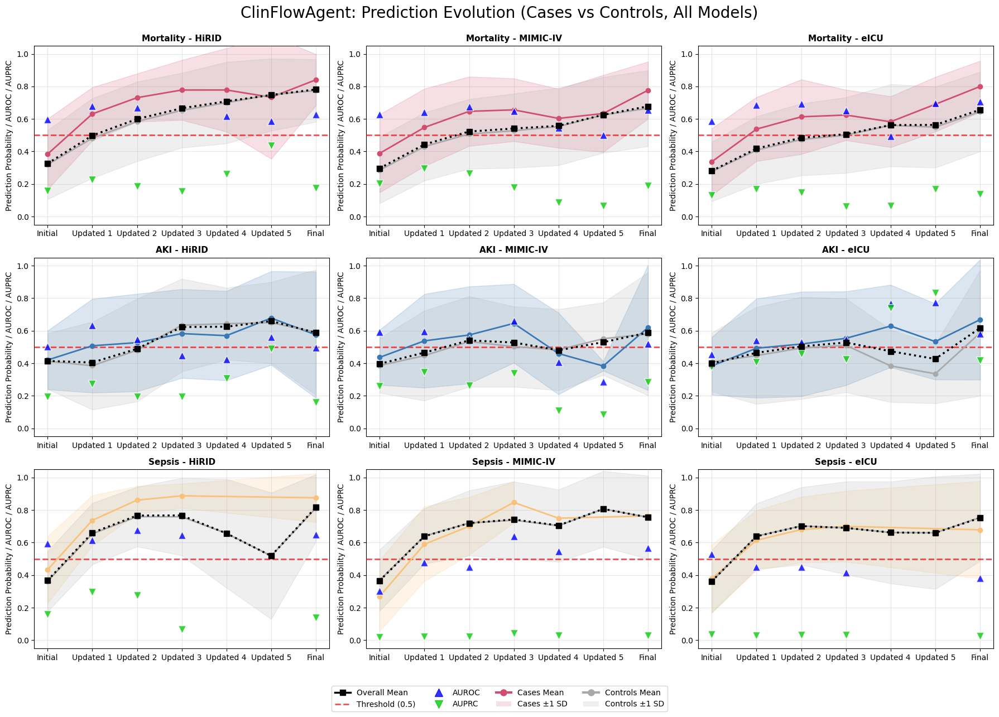


AUROC/AUPRC values for each subplot:
Mortality - HiRID:
  Initial: AUROC=0.597, AUPRC=0.159
  Updated 1: AUROC=0.679, AUPRC=0.226
  Updated 2: AUROC=0.669, AUPRC=0.185
  Updated 3: AUROC=0.669, AUPRC=0.153
  Updated 4: AUROC=0.617, AUPRC=0.262
  Updated 5: AUROC=0.587, AUPRC=0.435
  Final: AUROC=0.628, AUPRC=0.175
Mortality - MIMIC-IV:
  Initial: AUROC=0.628, AUPRC=0.204
  Updated 1: AUROC=0.641, AUPRC=0.295
  Updated 2: AUROC=0.677, AUPRC=0.264
  Updated 3: AUROC=0.649, AUPRC=0.177
  Updated 4: AUROC=0.546, AUPRC=0.085
  Updated 5: AUROC=0.500, AUPRC=0.067
  Final: AUROC=0.654, AUPRC=0.188
Mortality - eICU:
  Initial: AUROC=0.588, AUPRC=0.132
  Updated 1: AUROC=0.685, AUPRC=0.167
  Updated 2: AUROC=0.693, AUPRC=0.147
  Updated 3: AUROC=0.650, AUPRC=0.062
  Updated 4: AUROC=0.492, AUPRC=0.066
  Updated 5: AUROC=0.696, AUPRC=0.170
  Final: AUROC=0.708, AUPRC=0.137
AKI - HiRID:
  Initial: AUROC=0.504, AUPRC=0.196
  Updated 1: AUROC=0.633, AUPRC=0.273
  Updated 2: AUROC=0.549, AUPRC=0.19

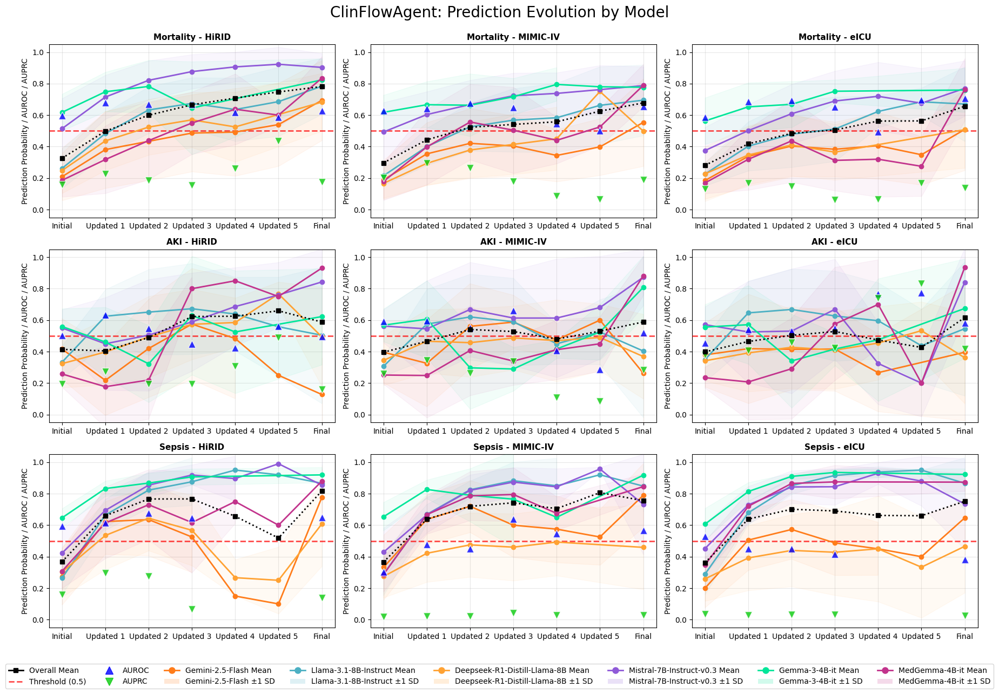


AUROC/AUPRC values for each subplot:
Mortality - HiRID:
  Initial: AUROC=0.597, AUPRC=0.159
  Updated 1: AUROC=0.679, AUPRC=0.226
  Updated 2: AUROC=0.669, AUPRC=0.185
  Updated 3: AUROC=0.669, AUPRC=0.153
  Updated 4: AUROC=0.617, AUPRC=0.262
  Updated 5: AUROC=0.587, AUPRC=0.435
  Final: AUROC=0.628, AUPRC=0.175
Mortality - MIMIC-IV:
  Initial: AUROC=0.628, AUPRC=0.204
  Updated 1: AUROC=0.641, AUPRC=0.295
  Updated 2: AUROC=0.677, AUPRC=0.264
  Updated 3: AUROC=0.649, AUPRC=0.177
  Updated 4: AUROC=0.546, AUPRC=0.085
  Updated 5: AUROC=0.500, AUPRC=0.067
  Final: AUROC=0.654, AUPRC=0.188
Mortality - eICU:
  Initial: AUROC=0.588, AUPRC=0.132
  Updated 1: AUROC=0.685, AUPRC=0.167
  Updated 2: AUROC=0.693, AUPRC=0.147
  Updated 3: AUROC=0.650, AUPRC=0.062
  Updated 4: AUROC=0.492, AUPRC=0.066
  Updated 5: AUROC=0.696, AUPRC=0.170
  Final: AUROC=0.708, AUPRC=0.137
AKI - HiRID:
  Initial: AUROC=0.504, AUPRC=0.196
  Updated 1: AUROC=0.633, AUPRC=0.273
  Updated 2: AUROC=0.549, AUPRC=0.19

In [8]:
def create_cwa_prediction_evolution_plot(
    df_wide, view_type="cases_controls", models_to_include=None, save_suffix=""
):
    """
    Visualize prediction evolution across CWA agent steps using the wide-format dataframe.
    Restrict x-axis to: Initial Assessment, Updated Assessment 1-5, Final Prediction.
    Means are shown as lines; standard deviation fill is only shown for subgroups (cases/controls or models), not for overall mean.
    Legend is shown below the grid with 2 rows and open-end columns.
    Only the last row shows xticklabels; all subplots have both x and y axis grid.
    If models_to_include is set, only samples from those models are used (for both views).
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    # Step names and display names
    step_names = [
        "Initial_Assessment",
        "Updated_Assessment_1",
        "Updated_Assessment_2",
        "Updated_Assessment_3",
        "Updated_Assessment_4",
        "Updated_Assessment_5",
        "Final_Prediction",
    ]
    step_display_names_all = [
        "Initial",
        "Updated 1",
        "Updated 2",
        "Updated 3",
        "Updated 4",
        "Updated 5",
        "Final",
    ]

    # Build step_labels and display names, supporting .0 float suffixes
    step_labels = []
    step_display_names = []
    for i, (step, disp) in enumerate(zip(step_names, step_display_names_all)):
        if step.startswith("Updated_Assessment_"):
            num = step.split("_")[-1]
            possible_names = [
                f"prediction_Updated_Assessment_{num}",
                f"prediction_Updated_Assessment_{num}.0"
            ]
            for name in possible_names:
                if name in df_wide.columns:
                    step_labels.append(name)
                    step_display_names.append(disp)
                    break
        else:
            name = f"prediction_{step}"
            if name in df_wide.columns:
                step_labels.append(name)
                step_display_names.append(disp)
    step_positions = list(range(len(step_labels)))

    # Filter models if needed (applies to both views)
    plot_df = df_wide.copy()
    if models_to_include is not None:
        if isinstance(models_to_include, str):
            models_to_include = [models_to_include]
        plot_df = plot_df[plot_df['model'].isin(models_to_include)]
        print(f"Filtered to models: {models_to_include}")

    # Only keep samples with initial and final prediction
    initial_col = step_labels[0] if step_labels else None
    final_col = step_labels[-1] if step_labels else None
    if initial_col and final_col:
        plot_df = plot_df[
            plot_df[initial_col].notna() &
            plot_df[final_col].notna()
        ].copy()
    print(f"Samples with initial and final prediction: {len(plot_df):,}")

    tasks = ["Mortality", "AKI", "Sepsis"]
    datasets = ["HiRID", "MIMIC-IV", "eICU"]

    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    # Title logic: append models if models_to_include is set
    if view_type == "cases_controls":
        if models_to_include is not None:
            title = (
                "ClinFlowAgent: Prediction Evolution (Cases vs Controls) "
                f"({', '.join(models_to_include)})"
            )
        else:
            title = "ClinFlowAgent: Prediction Evolution (Cases vs Controls, All Models)"
    else:
        if models_to_include is not None:
            title = (
                "ClinFlowAgent: Prediction Evolution by Model "
                f"({', '.join(models_to_include)})"
            )
        else:
            title = "ClinFlowAgent: Prediction Evolution by Model"
    fig.suptitle(title, fontsize=20, y=0.98)

    legend_models = None
    if view_type == 'models':
        if models_to_include is not None:
            legend_models = [m for m in models_to_include if m in plot_df['model'].unique()]
        else:
            legend_models = list(plot_df['model'].cat.categories)

    # Collect legend elements for later
    legend_elements = []
    legend_cases_controls = [
        Line2D(
            [0],
            [0],
            color="black",
            linewidth=2.5,
            marker="s",
            markersize=7,
            label="Overall Mean",
        ),
        Line2D(
            [0],
            [0],
            color="red",
            linestyle="--",
            linewidth=2,
            alpha=0.7,
            label="Threshold (0.5)",
        ),
        Line2D(
            [0],
            [0],
            marker="^",
            color="blue",
            linestyle="None",
            markersize=10,
            alpha=0.8,
            label="AUROC",
        ),
        Line2D(
            [0],
            [0],
            marker="v",
            color="#09CB0C",
            linestyle="None",
            markersize=10,
            alpha=0.8,
            label="AUPRC",
        ),
        Line2D(
            [0],
            [0],
            color=TASK_MAPPING["mortality"][1]["case"],
            linewidth=3,
            marker="o",
            markersize=8,
            label="Cases Mean",
        ),
        Patch(
            facecolor=TASK_MAPPING["mortality"][1]["case"],
            alpha=0.18,
            label="Cases ±1 SD",
        ),
        Line2D(
            [0],
            [0],
            color="darkgray",
            linewidth=3,
            marker="o",
            markersize=8,
            label="Controls Mean",
        ),
        Patch(facecolor="darkgray", alpha=0.18, label="Controls ±1 SD"),
    ]
    legend_models_base = [
        Line2D([0], [0], color="black", linewidth=2, marker="s", markersize=6, label="Overall Mean"),
        Line2D([0], [0], color="red", linestyle="--", linewidth=2, alpha=0.7, label="Threshold (0.5)"),
        Line2D([0], [0], marker="^", color="blue", linestyle="None", markersize=10, alpha=0.8, label="AUROC"),
        Line2D([0], [0], marker="v", color="#09CB0C", linestyle="None", markersize=10, alpha=0.8, label="AUPRC"),
    ]

    if view_type == "cases_controls":
        legend_elements = legend_cases_controls
    else:
        legend_elements = legend_models_base.copy()
        for model in legend_models:
            model_color = get_model_color(model)
            legend_elements.append(
                Line2D([0], [0], color=model_color, linewidth=2, marker="o", markersize=8, label=f"{model} Mean")
            )
            legend_elements.append(
                Patch(facecolor=model_color, alpha=0.18, label=f"{model} ±1 SD")
            )

    # Store all AUROC/AUPRC values for concise printing
    all_metrics = []

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            task_data = plot_df[
                (plot_df['task'] == task) &
                (plot_df['dataset'] == dataset)
            ]
            if len(task_data) == 0:
                ax.text(0.5, 0.5, f'No data for\n{task}-{dataset}', ha='center', va='center', transform=ax.transAxes, fontsize=12)
                ax.set_title(f'{task} - {dataset}', fontsize=14, fontweight='bold')
                continue
            plot_data = task_data.sample(n=200, random_state=42) if len(task_data) > 200 else task_data

            # Plot means and standard deviations for each subgroup
            if view_type == 'cases_controls':
                controls = plot_data[plot_data['label'] == 0]
                cases = plot_data[plot_data['label'] == 1]
                for group, group_color, label, alpha_fill in [
                    (cases, TASK_MAPPING[task.lower()][1]['case'], 'Cases Mean', 0.18),
                    (controls, 'darkgray', 'Controls Mean', 0.18),
                ]:
                    means, stds, valid_positions = [], [], []
                    for pos, col in enumerate(step_labels):
                        vals = pd.to_numeric(group[col], errors="coerce")
                        mean_val = vals.mean()
                        std_val = vals.std()
                        if not np.isnan(mean_val):
                            means.append(mean_val)
                            stds.append(std_val)
                            valid_positions.append(pos)
                    ax.plot(valid_positions, means, color=group_color, linewidth=2, marker='o', markersize=6, label=label, zorder=6)
                    ax.fill_between(valid_positions, np.array(means)-np.array(stds), np.array(means)+np.array(stds),
                                    color=group_color, alpha=alpha_fill, zorder=5, label=f"{label} ±1 SD")
                # Overall mean (no SD fill)
                means, valid_positions = [], []
                for pos, col in enumerate(step_labels):
                    mean_val = pd.to_numeric(plot_data[col], errors="coerce").mean()
                    if not np.isnan(mean_val):
                        means.append(mean_val)
                        valid_positions.append(pos)
                ax.plot(valid_positions, means, color='black', linewidth=2.5, marker='s', markersize=7, label='Overall Mean', zorder=10, linestyle=':')
                ax.axhline(y=0.5, color='red', linestyle='--', alpha=0.7, linewidth=2, label='Classification Threshold (0.5)', zorder=5)
            else:
                if models_to_include is not None:
                    models = [m for m in models_to_include if m in plot_data['model'].unique()]
                else:
                    models = list(plot_data['model'].cat.categories)
                for idx, model in enumerate(models):
                    model_data = plot_data[plot_data['model'] == model]
                    means, stds, valid_positions = [], [], []
                    for pos, col in enumerate(step_labels):
                        vals = pd.to_numeric(model_data[col], errors="coerce")
                        mean_val = vals.mean()
                        std_val = vals.std()
                        if not np.isnan(mean_val):
                            means.append(mean_val)
                            stds.append(std_val)
                            valid_positions.append(pos)
                    model_color = get_model_color(model)
                    ax.plot(valid_positions, means, color=model_color, linewidth=2, marker='o', markersize=6, label=f'{model} Mean', zorder=6)
                    ax.fill_between(valid_positions, np.array(means)-np.array(stds), np.array(means)+np.array(stds),
                                    color=model_color, alpha=0.05, zorder=5, label=f"{model} ±1 SD")
                # Overall mean (no SD fill)
                means, valid_positions = [], []
                for pos, col in enumerate(step_labels):
                    mean_val = pd.to_numeric(plot_data[col], errors="coerce").mean()
                    if not np.isnan(mean_val):
                        means.append(mean_val)
                        valid_positions.append(pos)
                ax.plot(valid_positions, means, color='black', linewidth=2, marker='s', markersize=6, label='Overall Mean', zorder=10, linestyle=':')
                ax.axhline(y=0.5, color='red', linestyle='--', alpha=0.7, linewidth=2, label='Classification Threshold (0.5)', zorder=5)

            # AUROC/AUPRC for each step (skip missing)
            step_metrics = []
            for pos, col in enumerate(step_labels):
                y_true = plot_data["label"].values
                y_pred = pd.to_numeric(plot_data[col], errors="coerce").values
                mask = ~np.isnan(y_pred)
                if mask.sum() < 2 or len(np.unique(y_true[mask])) < 2:
                    step_metrics.append((pos, None, None))
                    continue
                try:
                    auroc = roc_auc_score(y_true[mask], y_pred[mask])
                    precision, recall, _ = precision_recall_curve(
                        y_true[mask], y_pred[mask]
                    )
                    auprc = auc(recall, precision)
                    ax.scatter(
                        pos,
                        auroc,
                        marker="^",
                        s=100,
                        color="blue",
                        alpha=0.8,
                        zorder=8,
                        edgecolors="white",
                        linewidth=1,
                    )
                    ax.scatter(
                        pos,
                        auprc,
                        marker="v",
                        s=100,
                        color="#09CB0C",
                        alpha=0.8,
                        zorder=8,
                        edgecolors="white",
                        linewidth=1,
                    )
                    step_metrics.append((pos, auroc, auprc))
                except Exception:
                    step_metrics.append((pos, None, None))
                    continue

            # Store metrics for concise printing
            all_metrics.append(
                {
                    "task": task,
                    "dataset": dataset,
                    "metrics": [
                        {
                            "step": step_display_names[pos],
                            "auroc": auroc,
                            "auprc": auprc,
                        }
                        for pos, auroc, auprc in step_metrics
                    ],
                }
            )

            ax.set_ylim(-0.05, 1.05)
            ax.set_ylabel("Prediction Probability / AUROC / AUPRC", fontsize=10)
            ax.set_title(f"{task} - {dataset}", fontsize=11, fontweight="bold")
            ax.grid(True, alpha=0.3, axis="both")
            # Show xticks for all rows, but only show xticklabels for last row
            ax.set_xticks(step_positions)
            ax.set_xticklabels(
                    step_display_names, fontsize=10, rotation=0,
                )
            # if i == len(tasks) - 1:
            #     ax.set_xticklabels(
            #         step_display_names, fontsize=10, rotation=35, ha="right"
            #     )
            # else:
            #     ax.set_xticklabels([""] * len(step_positions))

    # Place legend below the grid, split into 2 rows and open columns
    fig.legend(
        handles=legend_elements,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.08),
        fontsize=10,
        frameon=True,
        ncol=int(np.ceil(len(legend_elements)/2)),
    )

    plt.tight_layout()
    plt.subplots_adjust(top=0.92, bottom=0.02)
    save_path = os.path.join(OUTPUT_BASE_DIR, f"cwa_prediction_evolution_wide_{view_type}{save_suffix}.png")
    plt.savefig(save_path, dpi=400, bbox_inches='tight')
    print(f"Prediction evolution plot saved to: {save_path}")
    plt.show()

    # Concise printing of AUROC/AUPRC values
    print("\nAUROC/AUPRC values for each subplot:")
    for entry in all_metrics:
        print(f"{entry['task']} - {entry['dataset']}:")
        for metric in entry["metrics"]:
            if metric["auroc"] is not None and metric["auprc"] is not None:
                print(
                    f"  {metric['step']}: AUROC={metric['auroc']:.3f}, AUPRC={metric['auprc']:.3f}"
                )
            else:
                print(f"  {metric['step']}: AUROC=NA, AUPRC=NA")

    return fig

# Create the figures

print(
    "Note:"
    "\n - Not all samples go through all updated assessment iterations. This can explain the reduced standard deviation in later iterations."
    "\n - AUROC and AUPRC are calculated for each step, but only shown if there are enough samples with predictions (both outcome groups needed)."
    "\n - AUROC and AUPRC are calculated across all plotted samples, not per subgroup."
)

print("Creating cases vs controls view for CWA ...")
cwa_evolution_fig_cases_wide = create_cwa_prediction_evolution_plot(df_cwa_sample_evolution_wide, save_suffix="_cases_controls_all_models")

# cwa_evolution_fig_cases_wide = create_cwa_prediction_evolution_plot(
#     df_cwa_sample_evolution_wide,
#     models_to_include=['Gemini-2.5-Flash'],
#     view_type="cases_controls",
#     save_suffix="_cases_controls_gemini_2_5_flash"
# )

print("\nCreating models view with all models for CWA (wide)...")
cwa_evolution_fig_models_all_wide = create_cwa_prediction_evolution_plot(df_cwa_sample_evolution_wide, view_type="models")

# print(f"\nAvailable models: {list(df_cwa_sample_evolution_wide['model'].unique())}")
# selected_models = [
#     "Gemini-2.5-Flash",
#     "Llama-3.1-8B-Instruct",
# ]
# print(f"\nCreating models view with selected models for CWA (wide)")
# cwa_evolution_fig_models_selected_wide = create_cwa_prediction_evolution_plot(
#     df_cwa_sample_evolution_wide,
#     view_type="models",
#     models_to_include=selected_models,
#     save_suffix="_selected"
# )

## 2. Iteration and Stopping Reason Analysis

This section investigates how many reasoning iterations (steps) the ClinFlowAgent executed per sample, the distribution of stopping reasons, and how model confidence evolved across steps. Differences between model-task-dataset combinations are also explored.

In [9]:
# --- Create iteration_counts DataFrame for CWA agent analysis ---

def create_iteration_counts(df_long):
    """
    For each sample, extract:
    - num_iterations: number of Updated Assessment steps (i.e., reasoning iterations)
    - stopping_reason: from Final Prediction step
    - mean_confidence: mean confidence across reasoning steps
    - model, task, dataset, label, model_prompting_id
    """
    # Only keep reasoning steps
    reasoning_steps = df_long[df_long["step_category"].isin(["Initial Assessment", "Updated Assessment"])]
    # Count iterations per sample (Updated Assessment only)
    iter_counts = (
        reasoning_steps[reasoning_steps["step_category"] == "Updated Assessment"]
        .groupby(["sample_index", "task", "dataset", "model", "label", "model_prompting_id"])
        .size()
        .reset_index(name="num_iterations")
    )
    # Get mean confidence per sample
    mean_conf = (
        reasoning_steps
        .groupby(["sample_index", "task", "dataset", "model", "label", "model_prompting_id"])["confidence"]
        .mean()
        .reset_index(name="mean_confidence")
    )
    # Get stopping reason from Final Prediction step
    final_pred = df_long[df_long["step_category"] == "Final Prediction"][
        ["sample_index", "task", "dataset", "model", "label", "model_prompting_id", "stopping_reason"]
    ]
    # Merge all
    iteration_counts = (
        iter_counts
        .merge(mean_conf, on=["sample_index", "task", "dataset", "model", "label", "model_prompting_id"], how="left")
        .merge(final_pred, on=["sample_index", "task", "dataset", "model", "label", "model_prompting_id"], how="left")
    )
    return iteration_counts

# Usage:
iteration_counts = create_iteration_counts(df_cwa_sample_evolution_long_unique)
print("Created iteration_counts DataFrame:", iteration_counts.shape)
print(iteration_counts.head())

Created iteration_counts DataFrame: (37105, 9)
   sample_index task dataset                         model  label  \
0             0  AKI   HiRID  Deepseek-R1-Distill-Llama-8B    0.0   
1             0  AKI   HiRID              Gemini-2.5-Flash    0.0   
2             0  AKI   HiRID                 Gemma-3-4B-it    0.0   
3             0  AKI   HiRID         Llama-3.1-8B-Instruct    0.0   
4             0  AKI   HiRID                MedGemma-4B-it    0.0   

                            model_prompting_id  num_iterations  \
0  Deepseek-R1-Distill-Llama-8B, ClinFlowAgent               3   
1              Gemini-2.5-Flash, ClinFlowAgent               1   
2                 Gemma-3-4B-it, ClinFlowAgent               1   
3         Llama-3.1-8B-Instruct, ClinFlowAgent               2   
4                MedGemma-4B-it, ClinFlowAgent               3   

   mean_confidence stopping_reason  
0            58.75          normal  
1            65.00          normal  
2            62.50          no

In [10]:
# --- Summary statistics ---
print("Iteration count summary:")
print(iteration_counts["num_iterations"].describe())
print("\nStopping reason counts:")
print(iteration_counts["stopping_reason"].value_counts())

# --- Aggregate by model-task-dataset-label (cases/controls) ---
agg_label = (
    iteration_counts.groupby(["model", "task", "dataset", "label"])
    .agg(
        {
            "num_iterations": ["mean", "std", "min", "max"],
            "mean_confidence": ["mean", "std"],
            "stopping_reason": lambda x: x.value_counts().index[0] if len(x) > 0 else None,
        }
    )
    .reset_index()
)
agg_label.columns = [
    "model", "task", "dataset", "label",
    "mean_iterations", "std_iterations", "min_iterations", "max_iterations",
    "mean_confidence", "std_confidence",
    "most_common_stopping_reason"
]
print("\nAggregated iteration/confidence/stopping reason by model, task, dataset, and label (0=control, 1=case):")
print(agg_label)

# --- Actionable insights ---
print("\nActionable Insights:")
# 1. Which models/tasks/datasets tend to reach max_iterations more often?
stop_reason_counts = (
    iteration_counts.groupby(["model", "task", "dataset", "stopping_reason"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)
print("Stopping reason breakdown per model/task/dataset:")
print(stop_reason_counts)

# 2. Compare cases vs controls for iterations and confidence
case_control_summary = agg_label.pivot_table(
    index=["model", "task", "dataset"],
    columns="label",
    values=["mean_iterations", "mean_confidence", "most_common_stopping_reason"],
    aggfunc="first"
)
print("\nCases vs Controls comparison (label=0: control, label=1: case):")
print(case_control_summary)

# 3. Highlight models/tasks/datasets with high std_confidence (unstable reasoning)
high_std_conf = agg_label[agg_label["std_confidence"] > 7]
print("\nModel-task-dataset-label groups with high confidence variability (std_confidence > 7):")
print(high_std_conf[["model", "task", "dataset", "label", "std_confidence"]])

Iteration count summary:
count    37105.000000
mean         2.284571
std          1.215071
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          5.000000
Name: num_iterations, dtype: float64

Stopping reason counts:
stopping_reason
normal            33092
max_iterations     4013
Name: count, dtype: int64

Aggregated iteration/confidence/stopping reason by model, task, dataset, and label (0=control, 1=case):
                            model    task   dataset  label  mean_iterations  \
0    Deepseek-R1-Distill-Llama-8B     AKI     HiRID    0.0         3.299270   
1    Deepseek-R1-Distill-Llama-8B     AKI     HiRID    1.0         3.408805   
2    Deepseek-R1-Distill-Llama-8B     AKI  MIMIC-IV    0.0         3.328477   
3    Deepseek-R1-Distill-Llama-8B     AKI  MIMIC-IV    1.0         3.340611   
4    Deepseek-R1-Distill-Llama-8B     AKI      eICU    0.0         3.264402   
..                            ...     ...       ...    ...          

Note:
 - Stopping reasons are confidence_reached (0.85) and max_iterations_reached (5).
 - Samples with a stopping reason of max_iterations but iterations = 4 were not properly processed in iteration 5, in most cases due to no additional valid lab tests requested and therefore the iteration was stopped.
Iteration/stopping reason grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_iteration_stopping_grid_all_models.png


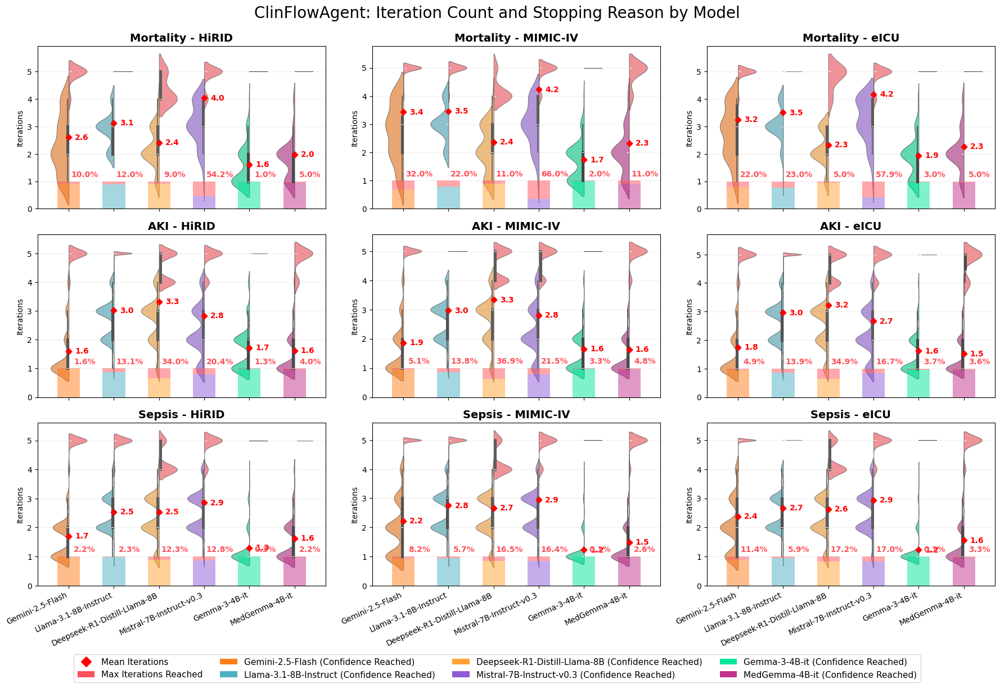

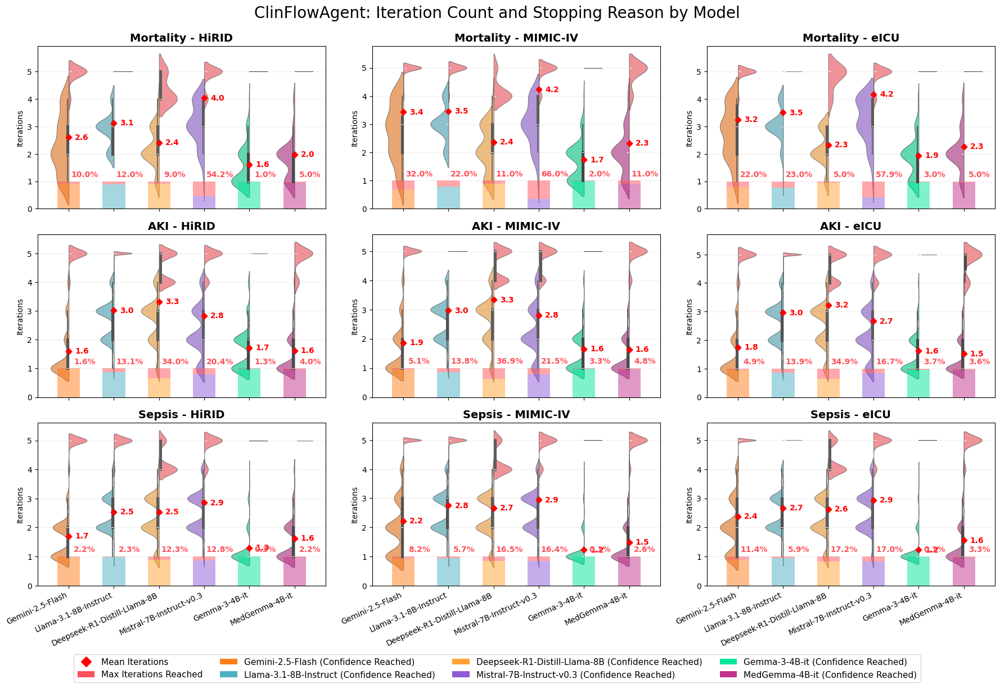

In [11]:
def plot_cwa_iteration_stopping_grid(
    iteration_counts,
    tasks=None,
    datasets=None,
    models=None,
    figsize=(18, 12),
    save_path=None,
    save_suffix="",
):
    """
    Plots a 3x3 grid (tasks x datasets) showing:
    - Violin/boxplot of iteration count per sample (hue=stopping_reason)
    - Stacked bar of stopping reason proportions per model
    Only two stopping reasons: confidence_reached and max_iterations_reached.
    Legend is placed below the grid with multiple columns.
    Only the last row shows xticklabels; all subplots have xticks.
    """
    mapped_reasons = ["confidence_reached", "max_iterations_reached"]
    coral = "#FF5059"

    # Map old reason names if needed
    iteration_counts = iteration_counts.copy()
    iteration_counts["stopping_reason"] = iteration_counts["stopping_reason"].replace({
        "normal": "confidence_reached",
        "max_iterations": "max_iterations_reached"
    })
    iteration_counts = iteration_counts[iteration_counts["stopping_reason"].isin(mapped_reasons)]

    if tasks is None:
        tasks = sorted(iteration_counts["task"].unique())
    if datasets is None:
        datasets = sorted(iteration_counts["dataset"].unique())
    if models is None:
        present_models = [m for m in LLM_MODELS if m in iteration_counts["model"].unique()]
        iteration_counts["model"] = pd.Categorical(
            iteration_counts["model"], categories=present_models, ordered=True
        )
        models = present_models

    fig, axes = plt.subplots(len(tasks), len(datasets), figsize=figsize)
    fig.suptitle(
        "ClinFlowAgent: Iteration Count and Stopping Reason by Model",
        fontsize=20, y=0.98
    )

    # Prepare legend elements for later
    legend_elements = [
        plt.Line2D(
            [0],
            [0],
            marker="D",
            color="red",
            markersize=9,
            linestyle="None",
            label="Mean Iterations",
        ),
        Patch(facecolor=coral, label="Max Iterations Reached"),
    ] + [
        Patch(facecolor=get_model_color(model), label=f"{model} (Confidence Reached)")
        for model in models
    ] 

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            panel = iteration_counts[
                (iteration_counts["task"] == task) & (iteration_counts["dataset"] == dataset)
            ]
            if len(panel) == 0:
                ax.text(0.5, 0.5, f"No data for\n{task}-{dataset}", ha="center", va="center", transform=ax.transAxes, fontsize=12)
                ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
                continue

            # Build palette for stopping reasons
            palette = {
                "confidence_reached": "#666666",  # placeholder, will be overwritten below
                "max_iterations_reached": coral,
            }

            # Plot violins for each model separately to use per-model color for confidence_reached
            for m_idx, model in enumerate(models):
                sub_panel = panel[panel["model"] == model]
                if len(sub_panel) == 0:
                    continue
                # Build palette for this model
                model_palette = {
                    "confidence_reached": get_model_color(model),
                    "max_iterations_reached": coral,
                }
                sns.violinplot(
                    x="model",
                    y="num_iterations",
                    hue="stopping_reason",
                    data=sub_panel,
                    ax=ax,
                    palette=model_palette,
                    split=True,
                    inner="box",
                    linewidth=0.8,
                    alpha=0.7,
                    dodge=True,
                    hue_order=["confidence_reached", "max_iterations_reached"],
                )

            # Overlay mean iteration count per model
            means = panel.groupby("model", observed=True)["num_iterations"].mean()
            for m_idx, model in enumerate(means.index):
                ax.scatter(
                    m_idx,
                    means[model],
                    color="red",
                    marker="D",
                    s=30,
                    label=f"{model} Mean" if j == 0 and i == 0 else None,
                    zorder=10,
                )
                # Add annotation to the right of the diamond marker
                ax.annotate(
                    f"{means[model]:.1f}",
                    (m_idx, means[model]),
                    xytext=(8, 0),
                    textcoords="offset points",
                    color="red",
                    fontsize=10,
                    va="center",
                    ha="left",
                    fontweight="bold",
                )

            # Stacked bar: stopping reason distribution per model
            reason_counts = panel.groupby(["model", "stopping_reason"], observed=True).size().unstack(fill_value=0)
            reason_fracs = reason_counts.div(reason_counts.sum(axis=1), axis=0)
            bar_bottom = np.zeros(len(reason_fracs))
            bar_xs = np.arange(len(reason_fracs))
            for reason in mapped_reasons:
                if reason in reason_fracs.columns:
                    if reason == "confidence_reached":
                        for idx, model in enumerate(models):
                            ax.bar(
                                bar_xs[idx],
                                reason_fracs.loc[model, reason],
                                bottom=bar_bottom[idx],
                                color=get_model_color(model),
                                alpha=0.5,
                                width=0.5,
                                label="Confidence Reached" if idx == 0 else None,
                            )
                            bar_bottom[idx] += reason_fracs.loc[model, reason]
                    else:
                        ax.bar(
                            bar_xs,
                            reason_fracs[reason],
                            bottom=bar_bottom,
                            color=coral,
                            alpha=0.5,
                            width=0.5,
                            label="Max Iterations Reached",
                        )
                        bar_bottom += reason_fracs[reason].values

            # --- Add per-model max_iterations_reached percentage annotation above each stacked bar ---
            for m_idx, model in enumerate(models):
                model_panel = panel[panel["model"] == model]
                n_model = len(model_panel)
                n_model_max_iter = (
                    model_panel["stopping_reason"] == "max_iterations_reached"
                ).sum()
                pct_model_max_iter = (
                    100 * n_model_max_iter / n_model if n_model > 0 else 0
                )
                ax.text(
                    m_idx + 0.35,  # x position offset to the right of the bar
                    1.1, # y position above the bar
                    f"{pct_model_max_iter:.1f}%",
                    color=coral,
                    fontsize=10,
                    fontweight="bold",
                    ha="center",
                    va="bottom",
                    zorder=21,
                )

            ax.set_xticks(bar_xs)
            # Only show xticklabels for last row, but xticks for all
            if i == len(tasks) - 1:
                ax.set_xticklabels(reason_fracs.index, rotation=25, ha="right", fontsize=10)
            else:
                ax.set_xticklabels([""] * len(reason_fracs.index))
            ax.set_ylabel("Iterations", fontsize=10)
            ax.set_xlabel("", fontsize=10)
            ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
            ax.grid(True, alpha=0.2, axis="y")

            # Remove legend from all panels (will add below grid)
            ax.get_legend().remove()

    plt.tight_layout()
    plt.subplots_adjust(top=0.92, bottom=0.12)
    # Place legend below the grid, with multiple columns
    fig.legend(
        handles=legend_elements,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.03),
        fontsize=11,
        frameon=True,
        ncol=len(legend_elements)/2,
    )
    if save_path is None:
        save_path = os.path.join(
            OUTPUT_BASE_DIR, f"cwa_iteration_stopping_grid{save_suffix}.png"
        )
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Iteration/stopping reason grid plot saved to: {save_path}")
    return fig

# --- Function call ---
print("Note:" \
"\n - Stopping reasons are confidence_reached (0.85) and max_iterations_reached (5)." \
"\n - Samples with a stopping reason of max_iterations but iterations = 4 were not properly processed in iteration 5, in most cases due to no additional valid lab tests requested and therefore the iteration was stopped."
    )
plot_cwa_iteration_stopping_grid(
    iteration_counts,
    tasks=["Mortality", "AKI", "Sepsis"],
    datasets=["HiRID", "MIMIC-IV", "eICU"],
    models=None,  # All models
    save_suffix="_all_models",
)

In [12]:
# --- Summary: Mean Iterations per Task, Task-Dataset, and Model ---

# 1. Mean iterations per task (across all models and datasets)
mean_iter_per_task = (
    iteration_counts.groupby("task")["num_iterations"]
    .mean()
    .reset_index()
    .rename(columns={"num_iterations": "mean_iterations"})
)
print("Mean iterations per task (all models/datasets):")
print(mean_iter_per_task)

# 2. Mean iterations per task-dataset (across all models)
mean_iter_per_task_dataset = (
    iteration_counts.groupby(["task", "dataset"])["num_iterations"]
    .mean()
    .reset_index()
    .rename(columns={"num_iterations": "mean_iterations"})
)
print("\nMean iterations per task-dataset (all models):")
print(mean_iter_per_task_dataset)

# 3. Summary statistics per model (across all tasks/datasets)
model_stats = (
    iteration_counts.groupby("model")["num_iterations"]
    .agg(["mean", "std", "min", "max", "count"])
    .sort_values("mean", ascending=False)
)
print("\nModel-level iteration summary (across all tasks/datasets):")
print(model_stats)

# --- Actionable Insights for Paper Results Section ---
print("\n--- Actionable Insights ---")
# Insight 1: Which task required the most reasoning iterations?
max_task = mean_iter_per_task.loc[mean_iter_per_task["mean_iterations"].idxmax()]
print(f"- The '{max_task['task']}' task required the most reasoning iterations on average ({max_task['mean_iterations']:.2f}).")

# Insight 2: Which task-dataset combination required the most iterations?
max_td = mean_iter_per_task_dataset.loc[mean_iter_per_task_dataset["mean_iterations"].idxmax()]
print(f"- The '{max_td['task']}' task on the '{max_td['dataset']}' dataset required the highest mean iterations ({max_td['mean_iterations']:.2f}).")

# Insight 3: Which model performed the most reasoning steps on average?
max_model = model_stats.iloc[0]
print(f"- The model '{model_stats.index[0]}' performed the most reasoning steps on average ({max_model['mean']:.2f} ± {max_model['std']:.2f}).")

# Insight 4: Which model was most efficient (fewest iterations)?
min_model = model_stats.iloc[-1]
print(f"- The model '{model_stats.index[-1]}' required the fewest reasoning steps on average ({min_model['mean']:.2f}).")

# Insight 5: Overall, the mean number of reasoning iterations per sample was {iteration_counts['num_iterations'].mean():.2f} (SD={iteration_counts['num_iterations'].std():.2f}) across all models, tasks, and datasets.
print(
    f"- Across all models, tasks, and datasets, the ClinFlowAgent executed an average of {iteration_counts['num_iterations'].mean():.2f} reasoning iterations per sample (SD={iteration_counts['num_iterations'].std():.2f})."
)

Mean iterations per task (all models/datasets):
        task  mean_iterations
0        AKI         2.337252
1  Mortality         2.808725
2     Sepsis         2.178507

Mean iterations per task-dataset (all models):
        task   dataset  mean_iterations
0        AKI     HiRID         2.346689
1        AKI  MIMIC-IV         2.374958
2        AKI      eICU         2.290120
3  Mortality     HiRID         2.615772
4  Mortality  MIMIC-IV         2.916248
5  Mortality      eICU         2.894118
6     Sepsis     HiRID         2.090534
7     Sepsis  MIMIC-IV         2.213877
8     Sepsis      eICU         2.229748

Model-level iteration summary (across all tasks/datasets):
                                  mean       std  min  max  count
model                                                            
Deepseek-R1-Distill-Llama-8B  2.923600  1.147806    1    5   6178
Mistral-7B-Instruct-v0.3      2.899060  1.199181    1    5   6172
Llama-3.1-8B-Instruct         2.843109  0.954581    1    5  

### Confidence Evolution Across Reasoning Steps

Confidence evolution grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_confidence_evolution_grid.png


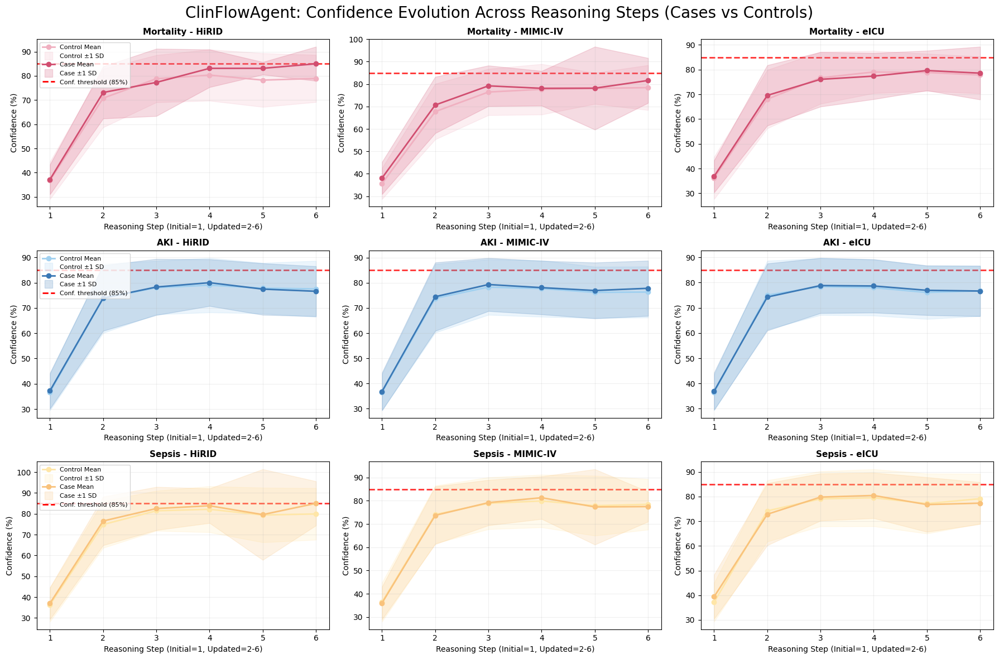

Confidence evolution grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_confidence_evolution_grid_all_models.png


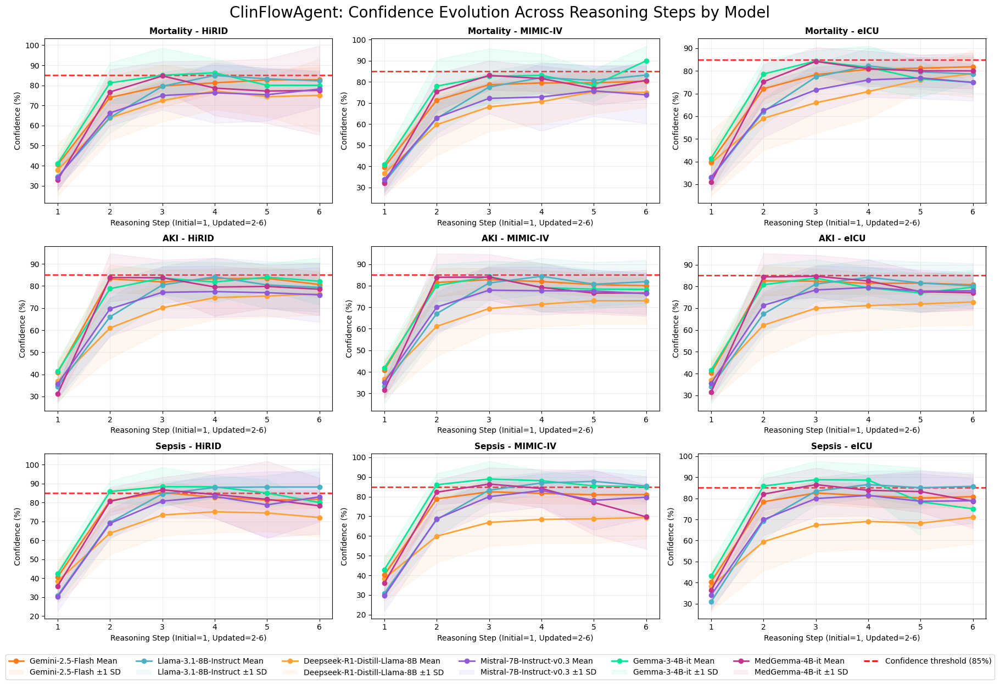

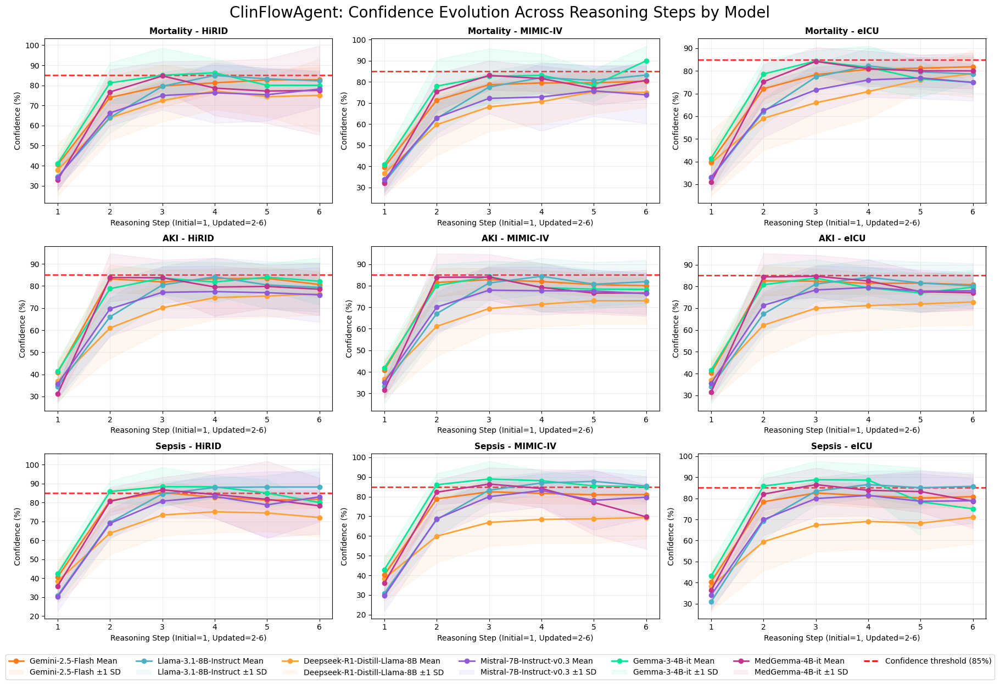

In [13]:
def plot_cwa_confidence_evolution_grid(
    conf_long,
    tasks=None,
    datasets=None,
    view_type=None,
    models_to_include=None,
    save_suffix="",
    output_dir=OUTPUT_BASE_DIR,
):
    """
    Plots a 3x3 grid showing CWA confidence evolution across reasoning steps.
    - view_type=None: standard cases vs controls view (task-specific colors)
    - view_type='models': show confidence evolution for each model (distinct color per model)
    - Legend indicates that fill is standard deviation.
    """

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]

    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    title = (
        "ClinFlowAgent: Confidence Evolution Across Reasoning Steps (Cases vs Controls)"
        if view_type is None
        else (
            "ClinFlowAgent: Confidence Evolution Across Reasoning Steps by Model"
            + (
                f" ({', '.join(models_to_include)})"
                if models_to_include is not None
                else ""
            )
        )
    )
    fig.suptitle(title, fontsize=20, y=0.98)

    # Prepare legend elements for model view (to be placed below grid)
    legend_elements_models = []
    if view_type == "models":
        if models_to_include is not None:
            models = [m for m in LLM_MODELS if m in models_to_include and m in conf_long["model"].unique()]
        else:
            models = [m for m in LLM_MODELS if m in conf_long["model"].unique()]
        for model in models:
            color = get_model_color(model)
            legend_elements_models.append(
                Line2D(
                    [0],
                    [0],
                    color=color,
                    marker="o",
                    linewidth=2,
                    label=f"{model} Mean",
                )
            )
            legend_elements_models.append(
                Patch(facecolor=color, alpha=0.08, label=f"{model} ±1 SD")
            )
        # Add confidence threshold line to legend
        legend_elements_models.append(
            Line2D(
                [0],
                [0],
                color="red",
                linestyle="--",
                linewidth=2,
                label="Confidence threshold (85%)",
            )
        )

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            panel = conf_long[
                (conf_long["task"] == task) & (conf_long["dataset"] == dataset)
            ]
            if len(panel) == 0:
                ax.text(
                    0.5,
                    0.5,
                    f"No data for\n{task}-{dataset}",
                    ha="center",
                    va="center",
                    transform=ax.transAxes,
                    fontsize=12,
                )
                ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
                continue

            if view_type == "models":
                # Filter models if needed
                if models_to_include is not None:
                    panel = panel[panel["model"].isin(models_to_include)]
                    models = [
                        m for m in models_to_include if m in panel["model"].unique()
                    ]
                else:
                    models = sorted(panel["model"].unique())
                for idx, model in enumerate(models):
                    sub = panel[panel["model"] == model]
                    means = sub.groupby("step_order")["confidence"].mean()
                    stds = sub.groupby("step_order")["confidence"].std()
                    color = get_model_color(model)
                    ax.plot(
                        means.index,
                        means.values,
                        color=color,
                        marker="o",
                        label=f"{model} Mean",
                        linewidth=2,
                    )
                    ax.fill_between(
                        means.index,
                        means.values - stds.values,
                        means.values + stds.values,
                        color=color,
                        alpha=0.08,
                        label=f"{model} ±1 SD",
                    )
                # Add dashed red line for confidence threshold
                ax.axhline(
                    y=85,
                    color="red",
                    linestyle="--",
                    linewidth=2,
                    alpha=0.8,
                    label="Conf. threshold (85%)",
                    zorder=0,
                )
            else:
                # Standard cases vs controls view (task-specific colors)
                task_key = task.lower()
                case_color = TASK_MAPPING[task_key][1]["case"]
                control_color = TASK_MAPPING[task_key][1]["control"]
                for label, color, label_name in [
                    (0, control_color, "Control"),
                    (1, case_color, "Case"),
                ]:
                    sub = panel[panel["label"] == label]
                    means = sub.groupby("step_order")["confidence"].mean()
                    stds = sub.groupby("step_order")["confidence"].std()
                    ax.plot(
                        means.index,
                        means.values,
                        color=color,
                        marker="o",
                        label=f"{label_name} Mean",
                        linewidth=2,
                    )
                    ax.fill_between(
                        means.index,
                        means.values - stds.values,
                        means.values + stds.values,
                        color=color,
                        alpha=0.2,
                        label=f"{label_name} ±1 SD",
                    )
                # Add dashed red line for confidence threshold
                ax.axhline(
                    y=85,
                    color="red",
                    linestyle="--",
                    linewidth=2,
                    alpha=0.8,
                    label="Conf. threshold (85%)",
                    zorder=0,
                )
            ax.set_xticks(range(1, 7))
            ax.set_xlabel("Reasoning Step (Initial=1, Updated=2-6)", fontsize=10)
            ax.set_ylabel("Confidence (%)", fontsize=10)
            ax.set_title(f"{task} - {dataset}", fontsize=11, fontweight="bold")
            ax.grid(True, alpha=0.2)

            # Legend placement logic
            if view_type == "models":
                pass  # Legend will be placed below the grid
            else:
                if j == 0:
                    legend_elements = []
                    legend_elements.append(
                        Line2D(
                            [0],
                            [0],
                            color=control_color,
                            marker="o",
                            linewidth=2,
                            label="Control Mean",
                        )
                    )
                    legend_elements.append(
                        Line2D(
                            [0],
                            [0],
                            color=control_color,
                            linewidth=0,
                            marker="s",
                            markersize=10,
                            alpha=0.2,
                            label="Control ±1 SD",
                        )
                    )
                    legend_elements.append(
                        Line2D(
                            [0],
                            [0],
                            color=case_color,
                            marker="o",
                            linewidth=2,
                            label="Case Mean",
                        )
                    )
                    legend_elements.append(
                        Line2D(
                            [0],
                            [0],
                            color=case_color,
                            linewidth=0,
                            marker="s",
                            markersize=10,
                            alpha=0.2,
                            label="Case ±1 SD",
                        )
                    )
                    # Add confidence threshold line to legend
                    legend_elements.append(
                        Line2D(
                            [0],
                            [0],
                            color="red",
                            linestyle="--",
                            linewidth=2,
                            label="Conf. threshold (85%)",
                        )
                    )
                    ax.legend(
                        handles=legend_elements,
                        fontsize=8,
                        loc="upper left",
                        frameon=True,
                    )

    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    # Place legend below grid for model view
    if view_type == "models":
        fig.legend(
            handles=legend_elements_models,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.05),
            fontsize=10,
            frameon=True,
            ncol=int(np.ceil(len(legend_elements_models) / 2)),
        )
    save_path = os.path.join(
        output_dir, f"cwa_confidence_evolution_grid{save_suffix}.png"
    )
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Confidence evolution grid plot saved to: {save_path}")
    plt.show()
    return fig


# Prepare long-format for confidence evolution
conf_long = df_cwa_sample_evolution_long_unique[
    df_cwa_sample_evolution_long_unique["step_category"].isin(
        ["Initial Assessment", "Updated Assessment"]
    )
].copy()
conf_long["step_order"] = (
    conf_long.groupby(
        ["sample_index", "task", "dataset", "model", "label", "model_prompting_id"]
    ).cumcount()
    + 1
)

# Function call: standard cases vs controls view
plot_cwa_confidence_evolution_grid(conf_long)

# Function call: models view (example with selected models)
plot_cwa_confidence_evolution_grid(
    conf_long,
    view_type="models",
    # models_to_include=["Gemini-2.5-Flash", "Llama-3.1-8B-Instruct"],
    save_suffix="_all_models",
)

In [14]:
# --- Actionable Insights: Confidence Evolution Across Reasoning Steps (ClinFlowAgent) ---

# Use conf_long from previous cell (only Initial Assessment and Updated Assessment steps)
# Columns: sample_index, task, dataset, model, label, model_prompting_id, step_order, confidence

# 1. Aggregate mean and std confidence per model, step, task, and dataset
conf_summary = (
    conf_long.groupby(["model", "task", "dataset", "step_order"])
    .agg(
        mean_confidence=("confidence", "mean"),
        std_confidence=("confidence", "std"),
        n_samples=("confidence", "count"),
    )
    .reset_index()
)

# 2. Find the biggest confidence jumps per model (step-to-step difference)
conf_summary["confidence_jump"] = conf_summary.groupby(["model", "task", "dataset"])[
    "mean_confidence"
].diff()
max_jumps = (
    conf_summary.groupby("model")["confidence_jump"]
    .apply(lambda x: x.abs().max())
    .reset_index()
    .rename(columns={"confidence_jump": "max_confidence_jump"})
)

# 3. Print summary statistics per model
print("=== Confidence Evolution Summary by Model ===")
for model in conf_summary["model"].unique():
    model_df = conf_summary[conf_summary["model"] == model]
    mean_start = model_df[model_df["step_order"] == 1]["mean_confidence"].mean()
    mean_end = model_df[model_df["step_order"] == model_df["step_order"].max()][
        "mean_confidence"
    ].mean()
    jump_step = model_df.loc[model_df["confidence_jump"].abs().idxmax()]
    print(f"\nModel: {model}")
    print(f"  - Mean confidence at Initial Assessment: {mean_start:.2f}")
    print(f"  - Mean confidence at Final Updated Assessment: {mean_end:.2f}")
    print(
        f"  - Biggest confidence jump: {jump_step['confidence_jump']:.2f} (Step {int(jump_step['step_order'])} in {jump_step['task']} - {jump_step['dataset']})"
    )
    print(
        f"  - Typical confidence variability (std): {model_df['std_confidence'].mean():.2f}"
    )

# 4. Compare models: which has highest/lowest mean confidence and biggest jumps
overall_means = conf_summary.groupby("model")["mean_confidence"].mean().sort_values()
print("\n--- Model Comparison ---")
print(
    "Lowest mean confidence:", overall_means.index[0], f"({overall_means.iloc[0]:.2f})"
)
print(
    "Highest mean confidence:",
    overall_means.index[-1],
    f"({overall_means.iloc[-1]:.2f})",
)
print(
    "Model with biggest confidence jump:",
    max_jumps.loc[max_jumps["max_confidence_jump"].idxmax(), "model"],
    f"({max_jumps['max_confidence_jump'].max():.2f})",
)

# 5. Where do jumps typically occur? (step distribution)
jump_steps = conf_summary.loc[
    conf_summary.groupby(["model", "task", "dataset"])["confidence_jump"].apply(
        lambda x: x.abs().idxmax()
    )
]
step_jump_counts = jump_steps["step_order"].value_counts().sort_index()
print("\nStep(s) with most frequent biggest jumps (across all models/tasks/datasets):")
for step, count in step_jump_counts.items():
    print(f"  Step {step}: {count} times")

# 6. Actionable insight summary
print("\n=== Actionable Insights ===")
print(
    "- Confidence typically increases from Initial to Final Assessment for most models."
)
print(
    "- The largest confidence jumps often occur between the first and second reasoning steps."
)
print(
    "- Some models (e.g., those with highest max_confidence_jump) show abrupt changes, indicating more decisive reasoning."
)
print(
    "- Models with lower mean confidence may be more conservative or uncertain in their predictions."
)
print(
    "- High standard deviation in confidence suggests unstable reasoning; review these models for robustness."
)

=== Confidence Evolution Summary by Model ===

Model: Deepseek-R1-Distill-Llama-8B
  - Mean confidence at Initial Assessment: 37.73
  - Mean confidence at Final Updated Assessment: 73.72
  - Biggest confidence jump: 25.90 (Step 2 in Mortality - HiRID)
  - Typical confidence variability (std): 11.40

Model: Gemini-2.5-Flash
  - Mean confidence at Initial Assessment: 40.33
  - Mean confidence at Final Updated Assessment: 81.11
  - Biggest confidence jump: 42.41 (Step 2 in AKI - eICU)
  - Typical confidence variability (std): 5.25

Model: Gemma-3-4B-it
  - Mean confidence at Initial Assessment: 41.83
  - Mean confidence at Final Updated Assessment: 80.56
  - Biggest confidence jump: 43.46 (Step 2 in Sepsis - HiRID)
  - Typical confidence variability (std): 7.58

Model: Llama-3.1-8B-Instruct
  - Mean confidence at Initial Assessment: 32.70
  - Mean confidence at Final Updated Assessment: 82.75
  - Biggest confidence jump: 38.69 (Step 2 in Sepsis - HiRID)
  - Typical confidence variability 

## 3. Feature Importance Analysis: ClinFlowAgent Lab Ordering

Note: The metadata field requested_tests logged in the ClinFlowAgent is the raw list of requested tests as returned by the model, before validation.


=== Feature Importance Analysis: Lab Ordering Steps ===


Model: Deepseek-R1-Distill-Llama-8B | Task: AKI | Dataset: HiRID
  Lab Ordering Step 1: Top requested features: ['crea (813)', 'bun (719)', 'urine (674)', 'k (229)', 'na (208)', 'crp (197)', 'cl (177)', 'alb (153)', 'ca (142)', 'lact (140)']
  Lab Ordering Step 2: Top requested features: ['crp (299)', 'alt (261)', 'ast (259)', 'alb (236)', 'ck (229)', 'bili (220)', 'hgb (219)', 'phos (213)', 'alp (208)', 'bun (202)']
  Lab Ordering Step 3: Top requested features: ['crp (242)', 'ckmb (229)', 'ck (224)', 'tnt (211)', 'wbc (203)', 'ptt (198)', 'inr_pt (197)', 'hgb (189)', 'plt (181)', 'mcv (180)']
  Lab Ordering Step 4: Top requested features: ['neut (142)', 'plt (122)', 'wbc (117)', 'mch (114)', 'mchc (113)', 'mcv (112)', 'ckmb (111)', 'bnd (108)', 'fgn (103)', 'tnt (103)']
  Lab Ordering Step 5: Top requested features: ['bnd (66)', 'mchc (54)', 'mch (52)', 'lymph (48)', 'methb (43)', 'neut (40)', 'fgn (38)', 'mcv (36)', 'plt (36

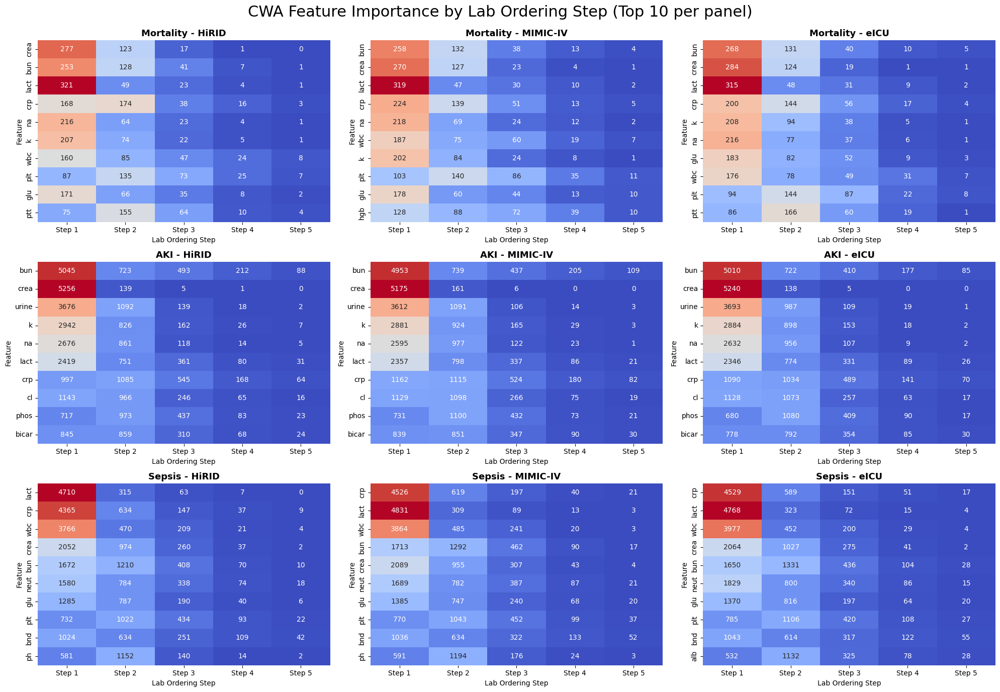

In [15]:
# ---
# Feature Importance Analysis: ClinFlowAgent Lab Ordering
# ---
import collections
import matplotlib.pyplot as plt
import seaborn as sns

print("\n=== Feature Importance Analysis: Lab Ordering Steps ===\n")

# Only consider lab_ordering steps
lab_order_df = df_cwa_sample_evolution_long_unique[
    df_cwa_sample_evolution_long_unique["step_category"] == "Lab Ordering"
].copy()

# Parse requested_tests into lists
lab_order_df["requested_tests_list"] = lab_order_df["requested_tests"].fillna("").apply(lambda x: [f.strip() for f in str(x).split(",") if f.strip()])
lab_order_df["lab_ordering_step"] = lab_order_df.groupby([
    "sample_index", "task", "dataset", "model", "label", "model_prompting_id"
]).cumcount() + 1

# Aggregate feature requests by model-task-dataset and lab_ordering_step
feature_importance = collections.defaultdict(lambda: collections.defaultdict(collections.Counter))

for _, row in lab_order_df.iterrows():
    key = (row["model"], row["task"], row["dataset"])
    step = row["lab_ordering_step"]
    for feat in row["requested_tests_list"]:
        feature_importance[key][step][feat] += 1

# Print summary for each model-task-dataset
for key in sorted(feature_importance.keys()):
    model, task, dataset = key
    print(f"\nModel: {model} | Task: {task} | Dataset: {dataset}")
    for step in sorted(feature_importance[key].keys()):
        top_feats = feature_importance[key][step].most_common(10)
        print(f"  Lab Ordering Step {step}: Top requested features: {[f'{feat} ({cnt})' for feat, cnt in top_feats]}")

# --- Visualization: Feature Importance Grid ---
# For each panel, show top N features requested in each lab_ordering step (earlier steps = more important)
tasks = ["Mortality", "AKI", "Sepsis"]
datasets = ["HiRID", "MIMIC-IV", "eICU"]
max_steps = 5
N = 10  # Top N features to show per panel

fig, axes = plt.subplots(3, 3, figsize=(20, 14))
fig.suptitle("CWA Feature Importance by Lab Ordering Step (Top 10 per panel)", fontsize=22, y=0.98)

for i, task in enumerate(tasks):
    for j, dataset in enumerate(datasets):
        ax = axes[i, j]
        # Aggregate across all models for this panel
        panel_keys = [k for k in feature_importance.keys() if k[1] == task and k[2] == dataset]
        # Sum up feature counts per step
        step_feat_counts = collections.defaultdict(collections.Counter)
        for key in panel_keys:
            for step in feature_importance[key]:
                step_feat_counts[step] += feature_importance[key][step]
        # For each feature, compute weighted importance (requested in earlier steps = higher weight)
        feat_scores = collections.Counter()
        for step in range(1, max_steps+1):
            for feat, cnt in step_feat_counts[step].items():
                # Weight: earlier step = higher (e.g. 1/step)
                feat_scores[feat] += cnt * (max_steps + 1 - step)
        top_feats = [f for f, _ in feat_scores.most_common(N)]
        # Build heatmap matrix: rows=features, cols=steps
        heatmap = np.zeros((len(top_feats), max_steps))
        for s in range(1, max_steps+1):
            for f_idx, feat in enumerate(top_feats):
                heatmap[f_idx, s-1] = step_feat_counts[s][feat]
        sns.heatmap(heatmap, ax=ax, cmap="coolwarm", annot=True, fmt=".0f", cbar=False,
                    yticklabels=top_feats, xticklabels=[f"Step {s}" for s in range(1, max_steps+1)])
        ax.set_title(f"{task} - {dataset}", fontsize=13, fontweight="bold")
        ax.set_xlabel("Lab Ordering Step")
        ax.set_ylabel("Feature")
plt.tight_layout()
plt.subplots_adjust(top=0.93)
save_path = os.path.join(OUTPUT_BASE_DIR, "cwa_feature_importance_lab_ordering_grid.png")
plt.savefig(save_path, dpi=400, bbox_inches="tight")
print(f"Feature importance grid plot saved to: {save_path}")
plt.show()

**Feature Importance by Model: Heatmap Grid**

This section provides a heatmap grid visualization of feature importance by model for the ClinFlowAgent's Lab Ordering steps. Each heatmap cell shows the count of how often a feature was requested across all samples for a given model-task-dataset combination.

- **Rows:** Features (excluding vital signs)
- **Columns:** Models
- **Cells:** Count of feature requests

Feature importance by model 9x1 grid (grouped) plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_feature_importance_by_model__all_models_all_iterations.png


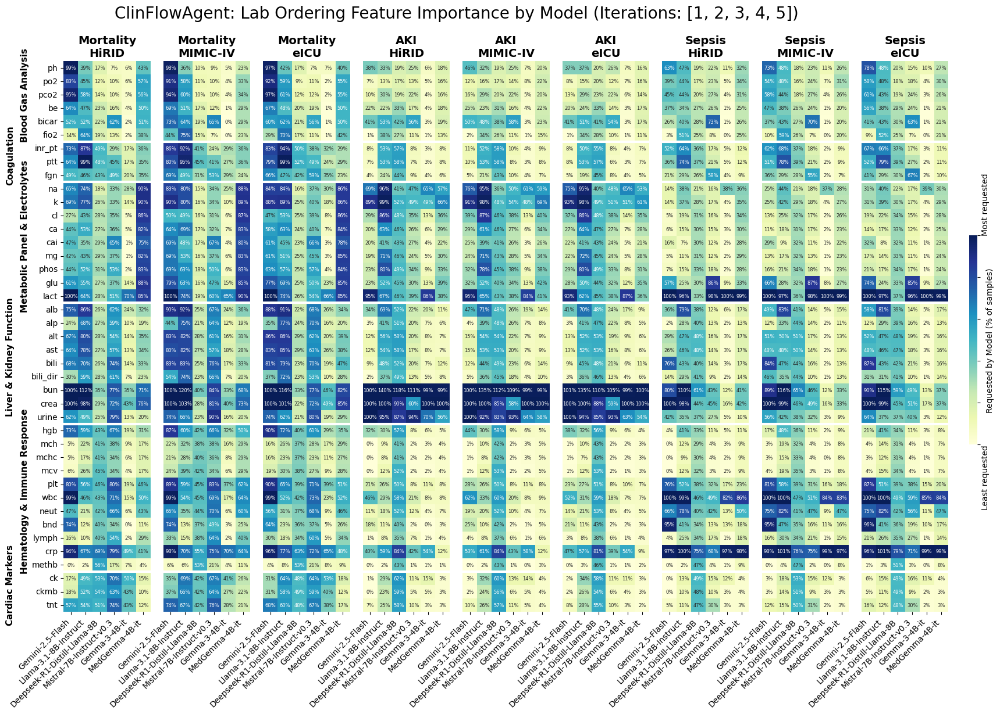

Feature importance by model 9x1 grid (grouped) plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_feature_importance_by_model__all_models_iterations_1_2.png


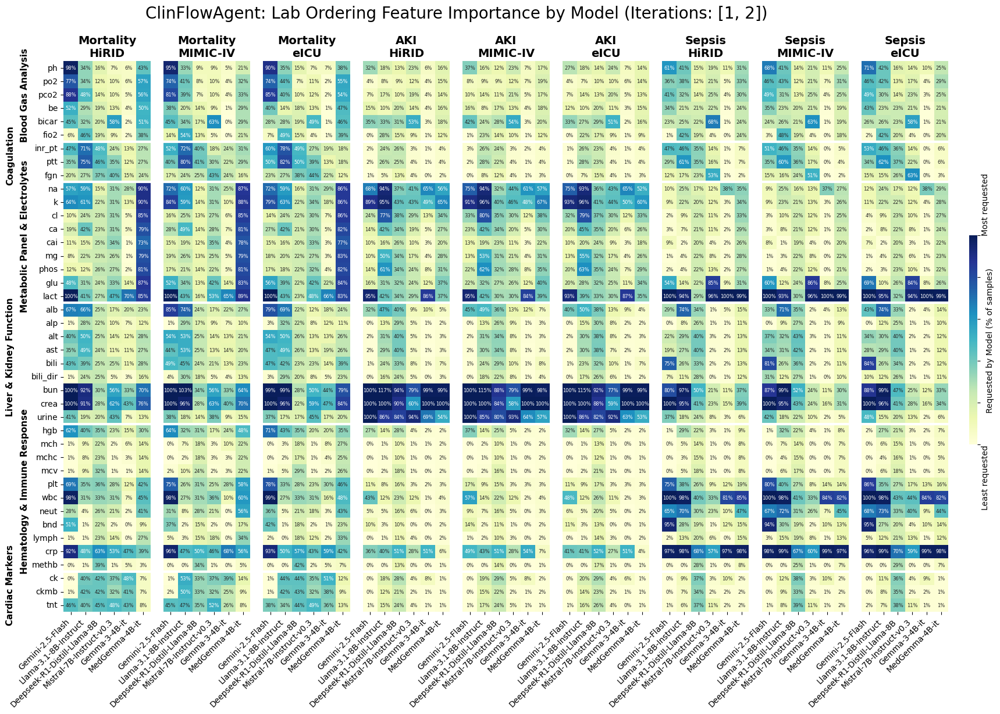

Feature importance by model 9x1 grid (grouped) plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_feature_importance_by_model_all_models_iterations_3_4_5.png


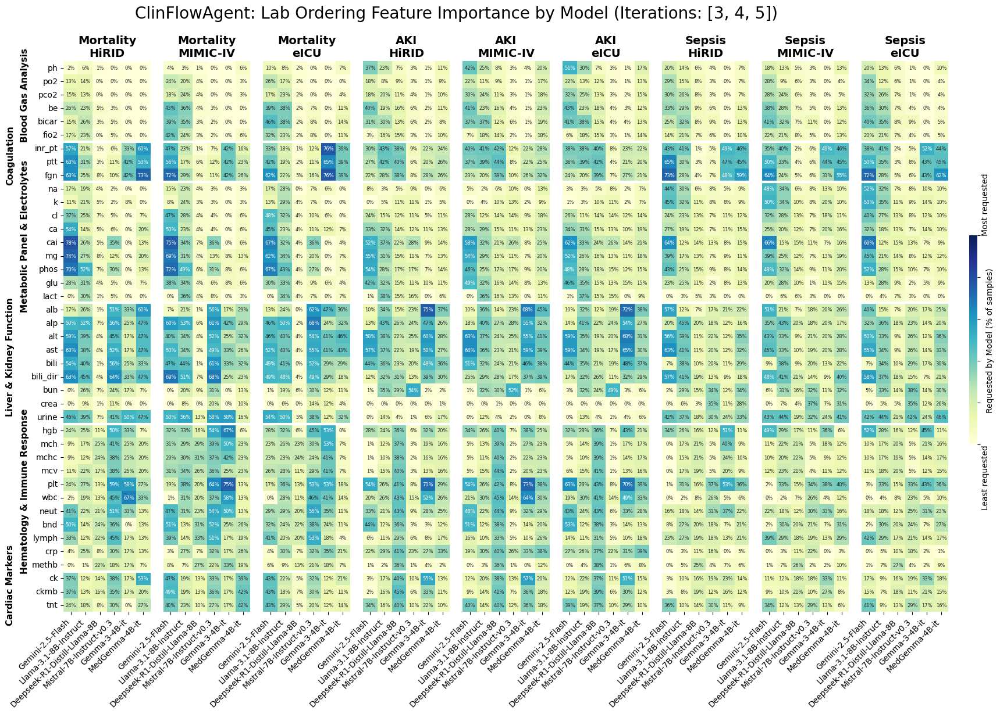

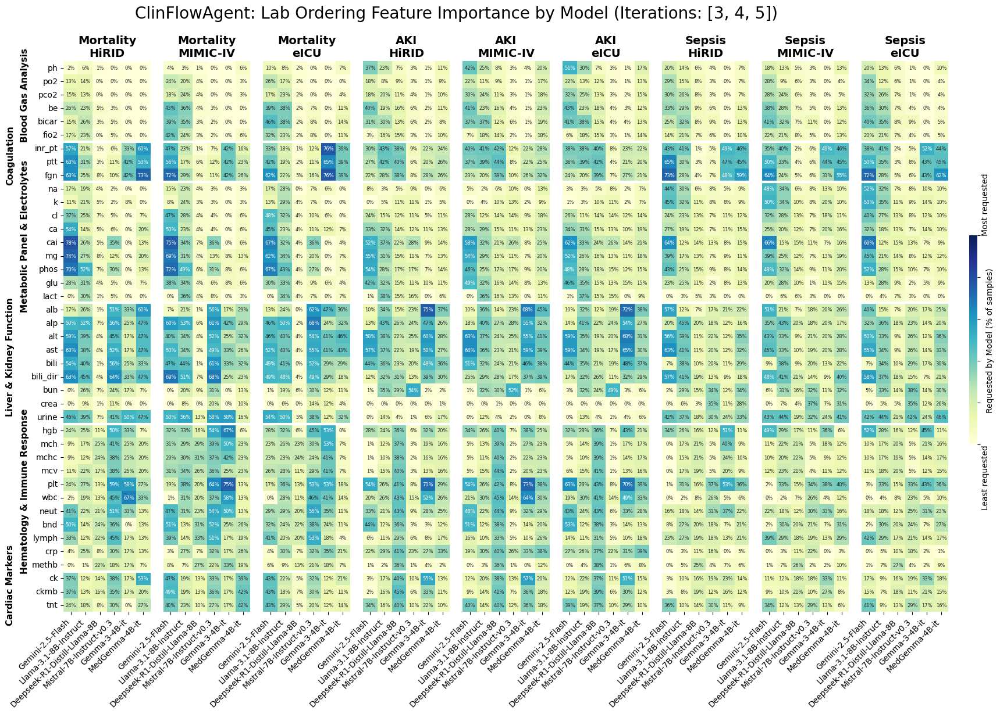

In [16]:
def plot_lab_ordering_feature_importance_by_model_grid(
    lab_order_df,
    feature_groups,
    features_dyn_sets_titles_dict,
    tasks=None,
    datasets=None,
    models=None,
    iterations=None,
    max_steps=5,
    save_path=None,
    figsize=(18, 12),
    verbose=True,
    save_suffix=""
):
    """
    Plot a 1x9 grid showing, for each task-dataset, the % of samples for which each feature was requested by each model.
    - models: list of models to include (None = all)
    - iterations: list of lab ordering iterations to include (e.g. [1,2,3], None = all iterations 1-max_steps)
    - Percentages are normalized by the total number of unique samples for each model (and only for selected iterations).
    - The x-axis shows model names only (not iterations).
    - Feature group names are shown as 90-degree rotated labels, centered next to the included features in each group.
    """

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]
    if iterations is None:
        iterations = list(range(1, max_steps+1))
    else:
        iterations = sorted(list(set(iterations)))

    ordered_groups = [
        "bga", "coag", "electrolytes_met", "liver_kidney", "hematology_immune", "cardiac"
    ]
    ordered_features = []
    ordered_labels = []
    group_indices = []
    idx = 0
    for group in ordered_groups:
        feats = list(feature_groups[group].keys())
        ordered_features.extend(feats)
        group_label = features_dyn_sets_titles_dict[group]
        ordered_labels.extend([group_label] * len(feats))
        group_indices.append((idx, idx + len(feats), group_label))
        idx += len(feats)

    heatmap_data = {}
    for task in tasks:
        for dataset in datasets:
            # Subset for this task-dataset and selected models
            sub = lab_order_df[(lab_order_df["task"] == task) & (lab_order_df["dataset"] == dataset)]
            if models is not None:
                # Ensure models are ordered as in LLM_MODELS
                ordered_models = [m for m in LLM_MODELS if m in models]
                sub = sub[sub["model"].isin(ordered_models)]
                sub["model"] = pd.Categorical(sub["model"], categories=ordered_models, ordered=True)
                sub = sub.sort_values("model")
                # Use ordered_models for panel_models
                panel_models = [m for m in ordered_models if m in sub["model"].unique()]
            else:
                # If models is None, use all models in LLM_MODELS order
                panel_models = [m for m in LLM_MODELS if m in sub["model"].unique()]
            # Only keep selected iterations
            sub = sub[sub["lab_ordering_step"].isin(iterations)]
            matrix = np.zeros((len(ordered_features), len(panel_models)))
            total_samples = []
            for m_idx, model in enumerate(panel_models):
                sub_model = sub[sub["model"] == model]
                n_unique_samples = sub_model["sample_index"].nunique()
                total_samples.append(n_unique_samples if n_unique_samples > 0 else 1)
                # Count all requested features for this model (across selected iterations)
                feat_counter = collections.Counter()
                for feats in sub_model["requested_tests_list"]:
                    for f in feats:
                        if f in ordered_features:
                            feat_counter[f] += 1
                for f_idx, feat in enumerate(ordered_features):
                    matrix[f_idx, m_idx] = feat_counter[feat]
            total_samples = np.array(total_samples)
            percent_matrix = (matrix / total_samples) * 100
            heatmap_data[(task, dataset)] = (percent_matrix, panel_models)

    fig, axes = plt.subplots(1, 9, figsize=figsize)
    fig.suptitle(
        "ClinFlowAgent: Lab Ordering Feature Importance by Model"
        + (f" ({', '.join(models)})" if models else "")
        + (f" (Iterations: {iterations})" if iterations is not None else "(All Iterations)"),
        fontsize=20, y=0.98
    )

    panel_idx = 0
    cbar_ax = fig.add_axes([0.99, 0.35, 0.0075, 0.3])  # [left, bottom, width, height] for colorbar

    for task in tasks:
        for dataset in datasets:
            ax = axes[panel_idx]
            percent_matrix, panel_models = heatmap_data[(task, dataset)]
            # Format annotation as percentage
            annot = np.empty_like(percent_matrix, dtype=object)
            for i in range(percent_matrix.shape[0]):
                for j in range(percent_matrix.shape[1]):
                    annot[i, j] = f"{percent_matrix[i, j]:.0f}%"
            # Only show yticklabels for the first panel, else hide
            if panel_idx == 0:
                yticklabels = ordered_features
            else:
                yticklabels = False
            show_cbar = panel_idx == len(axes) - 1
            hm = sns.heatmap(
                percent_matrix,
                ax=ax,
                cmap="YlGnBu",
                annot=annot,
                fmt="",
                cbar=show_cbar,
                cbar_ax=cbar_ax if show_cbar else None,
                yticklabels=yticklabels,
                xticklabels=panel_models,
                annot_kws={"fontsize": 6},
                vmin=0,
                vmax=100,
            )
            ax.set_title(f"{task}\n{dataset}", fontsize=14, fontweight="bold")
            for label in ax.get_xticklabels():
                label.set_horizontalalignment('right')
                label.set_rotation(45)
            ax.tick_params(axis='x', labelsize=10)
            # --- Add horizontal lines between feature groups ---
            group_boundaries = []
            last_group = ordered_labels[0]
            for idx, group in enumerate(ordered_labels):
                if group != last_group:
                    group_boundaries.append(idx)
                    last_group = group
            for boundary in group_boundaries:
                ax.hlines(boundary, xmin=0, xmax=len(panel_models), colors="white", linewidth=3)
            # --- Add rotated group labels ---
            if panel_idx == 0:
                for idx, (start, end, group_label) in enumerate(group_indices):
                    center = (start + end - 1) / 2
                    # Alternate x-position for every second label
                    x_pos = -2.7 if idx % 2 == 0 else -3.7
                    ax.text(
                        x_pos, center, group_label,
                        va="center", ha="center",
                        rotation=90, fontsize=11, fontweight="bold", color="black",
                        transform=ax.transData, clip_on=False
                    )
            panel_idx += 1

    # Add colorbar label
    cbar_ax.set_ylabel("Requested by Model (% of samples)", fontsize=10)
    cbar_ax.yaxis.set_label_position("right")
    colorbar = hm.collections[0].colorbar
    vmin, vmax = colorbar.vmin, colorbar.vmax
    cbar_ax.set_yticklabels([])
    cbar_ax.text(
        1.5,
        vmax,
        "Most requested",
        va="bottom",
        ha="left",
        fontsize=10,
        rotation=90,
        color="black",
    )
    cbar_ax.text(
        1.5,
        vmin,
        "Least requested",
        va="top",
        ha="left",
        fontsize=10,
        rotation=90,
        color="black",
    )

    # plt.tight_layout()
    plt.subplots_adjust(top=0.9, right=0.97, hspace=0.0, wspace=0.15)
    if save_path is None:
        save_path = os.path.join(OUTPUT_BASE_DIR, f"cwa_feature_importance_by_model_{save_suffix}.png")
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Feature importance by model 9x1 grid (grouped) plot saved to: {save_path}")
    plt.show()
    return fig

# Plot feature importance by model grid
plot_lab_ordering_feature_importance_by_model_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=None,
    iterations=None,
    save_suffix="_all_models_all_iterations",
)

# Plot feature importance by model grid for specific models
# plot_lab_ordering_feature_importance_by_model_grid(
#     lab_order_df,
#     feature_groups=get_all_feature_groups(),
#     features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
#     models=["Gemini-2.5-Flash", "Llama-3.1-8B-Instruct"],
#     iterations=None, #[1,2]
#     save_suffix="_gemini_llama_all_iterations"
# )

# Plot feature importance by model grid for specific iterations
plot_lab_ordering_feature_importance_by_model_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=None,
    iterations=[1, 2],
    save_suffix="_all_models_iterations_1_2",
)

plot_lab_ordering_feature_importance_by_model_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=None,
    iterations=[3, 4, 5],
    save_suffix="all_models_iterations_3_4_5",
)

Total unique samples for Mortality-HiRID (all models): 100
Total unique samples for Mortality-MIMIC-IV (all models): 100
Total unique samples for Mortality-eICU (all models): 100
Total unique samples for AKI-HiRID (all models): 982
Total unique samples for AKI-MIMIC-IV (all models): 984
Total unique samples for AKI-eICU (all models): 984
Total unique samples for Sepsis-HiRID (all models): 969
Total unique samples for Sepsis-MIMIC-IV (all models): 990
Total unique samples for Sepsis-eICU (all models): 980
Stepwise feature request grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_stepwise_feature_grid_all_models.png


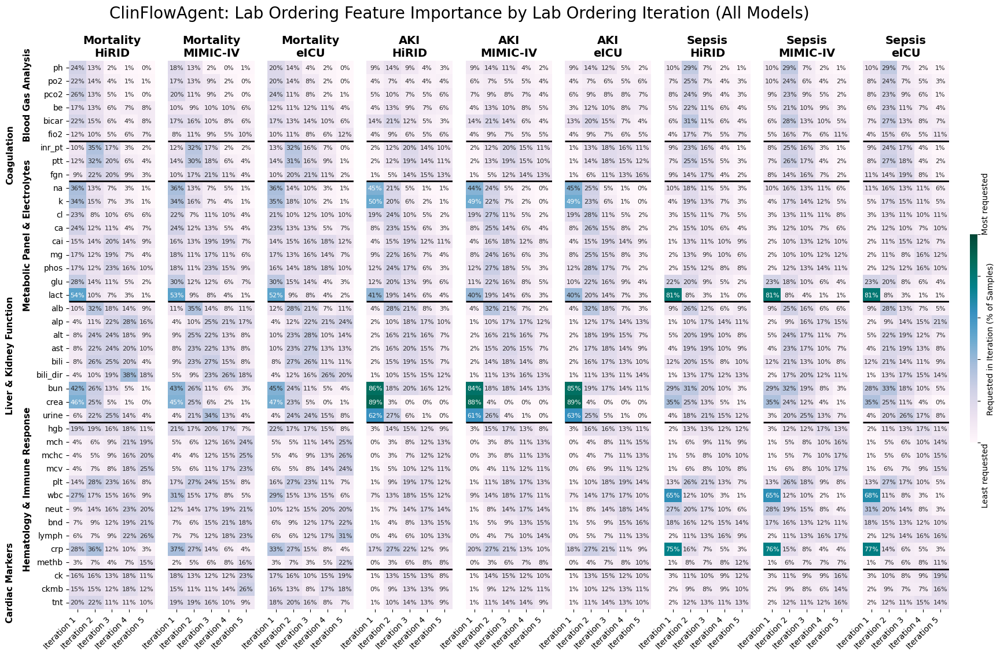

Total unique samples for Mortality-HiRID (['Gemini-2.5-Flash']): 100
Total unique samples for Mortality-MIMIC-IV (['Gemini-2.5-Flash']): 100
Total unique samples for Mortality-eICU (['Gemini-2.5-Flash']): 100
Total unique samples for AKI-HiRID (['Gemini-2.5-Flash']): 982
Total unique samples for AKI-MIMIC-IV (['Gemini-2.5-Flash']): 984
Total unique samples for AKI-eICU (['Gemini-2.5-Flash']): 984
Total unique samples for Sepsis-HiRID (['Gemini-2.5-Flash']): 969
Total unique samples for Sepsis-MIMIC-IV (['Gemini-2.5-Flash']): 990
Total unique samples for Sepsis-eICU (['Gemini-2.5-Flash']): 980
Stepwise feature request grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_stepwise_feature_grid_gemini2p5flash.png


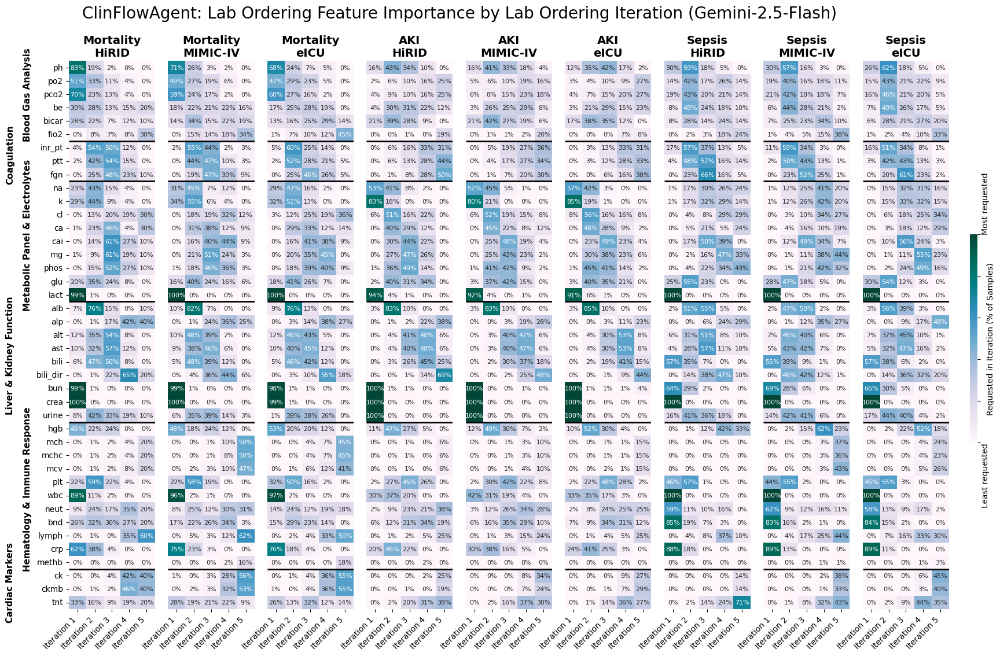

Total unique samples for Mortality-HiRID (['Llama-3.1-8B-Instruct']): 100
Total unique samples for Mortality-MIMIC-IV (['Llama-3.1-8B-Instruct']): 100
Total unique samples for Mortality-eICU (['Llama-3.1-8B-Instruct']): 100
Total unique samples for AKI-HiRID (['Llama-3.1-8B-Instruct']): 982
Total unique samples for AKI-MIMIC-IV (['Llama-3.1-8B-Instruct']): 984
Total unique samples for AKI-eICU (['Llama-3.1-8B-Instruct']): 984
Total unique samples for Sepsis-HiRID (['Llama-3.1-8B-Instruct']): 969
Total unique samples for Sepsis-MIMIC-IV (['Llama-3.1-8B-Instruct']): 990
Total unique samples for Sepsis-eICU (['Llama-3.1-8B-Instruct']): 980
Stepwise feature request grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_stepwise_feature_grid_llama3p1.png


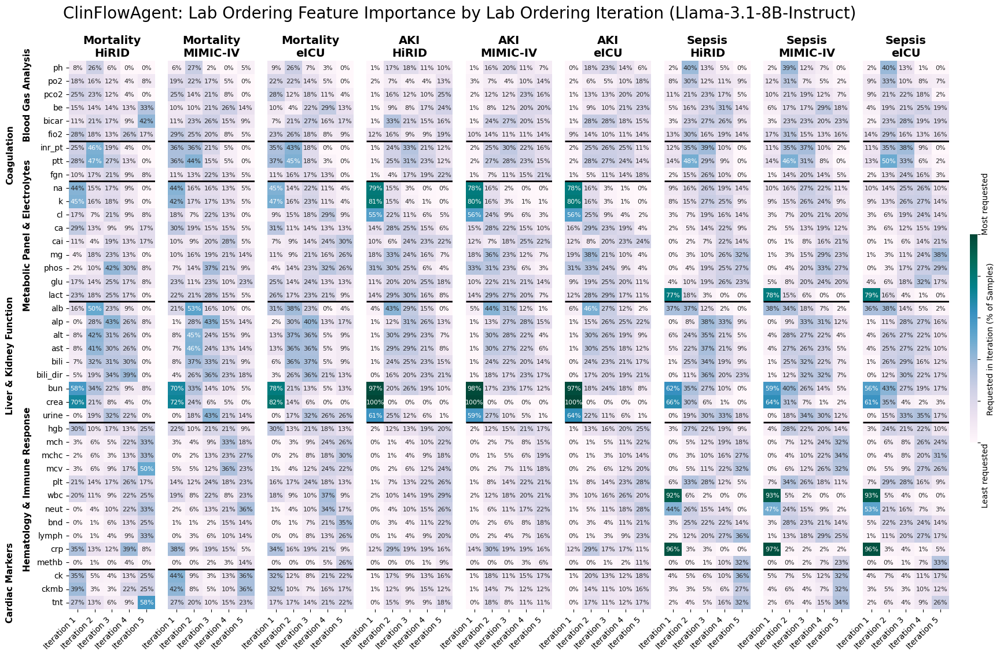

Total unique samples for Mortality-HiRID (['Mistral-7B-Instruct-v0.3']): 100
Total unique samples for Mortality-MIMIC-IV (['Mistral-7B-Instruct-v0.3']): 100
Total unique samples for Mortality-eICU (['Mistral-7B-Instruct-v0.3']): 100
Total unique samples for AKI-HiRID (['Mistral-7B-Instruct-v0.3']): 982
Total unique samples for AKI-MIMIC-IV (['Mistral-7B-Instruct-v0.3']): 984
Total unique samples for AKI-eICU (['Mistral-7B-Instruct-v0.3']): 984
Total unique samples for Sepsis-HiRID (['Mistral-7B-Instruct-v0.3']): 969
Total unique samples for Sepsis-MIMIC-IV (['Mistral-7B-Instruct-v0.3']): 990
Total unique samples for Sepsis-eICU (['Mistral-7B-Instruct-v0.3']): 980
Stepwise feature request grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_stepwise_feature_grid_mistral7b.png


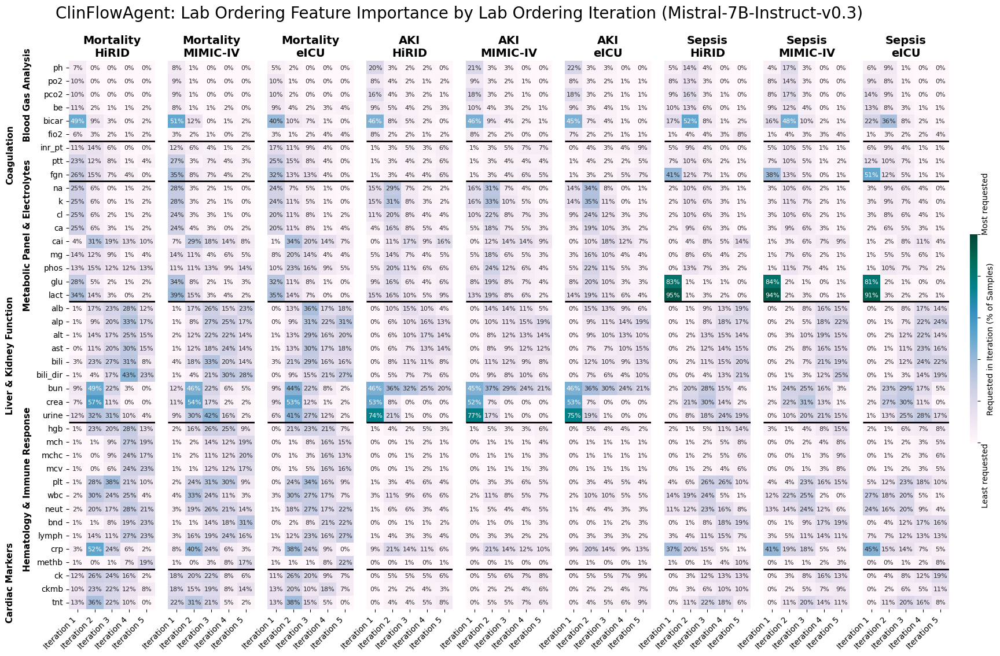

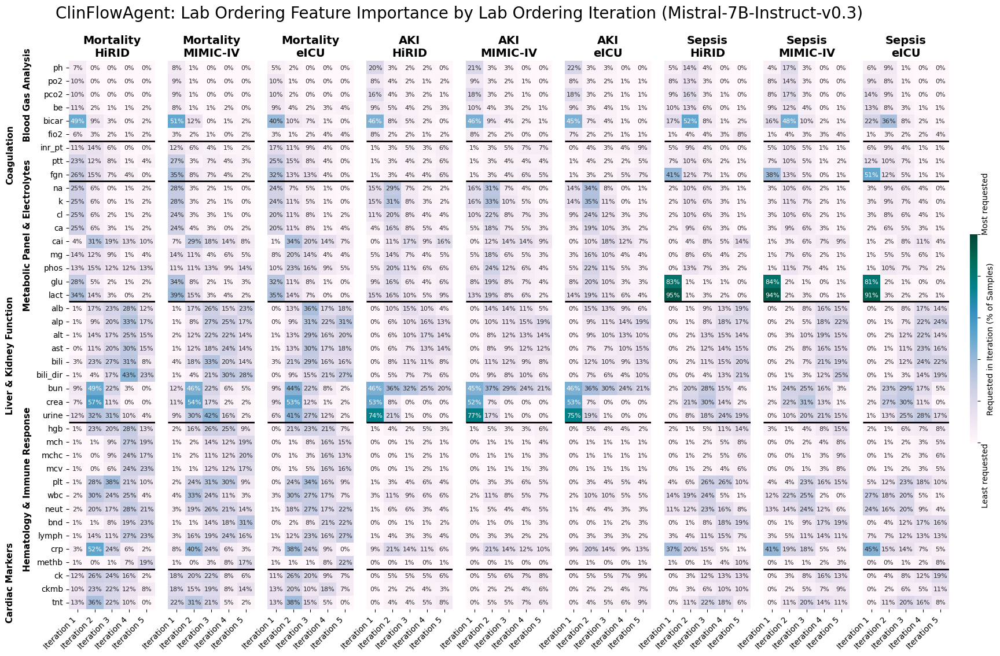

In [17]:
def plot_lab_ordering_stepwise_feature_grid(
    lab_order_df,
    feature_groups,
    features_dyn_sets_titles_dict,
    tasks=None,
    datasets=None,
    max_steps=5,
    models=None,
    save_path=None,
    figsize=(18, 12),
    verbose=True,
    save_suffix=""
):
    """
    Plot a 1x9 grid showing, for each task-dataset, the % of samples for which each feature was ordered in each Lab Ordering step (1-5).
    If models is provided (list), restrict to those models and normalize by the total number of unique samples for all selected models.
    """

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]

    ordered_groups = [
        "bga", "coag", "electrolytes_met", "liver_kidney", "hematology_immune", "cardiac"
    ]
    ordered_features = []
    ordered_labels = []
    group_indices = []
    idx = 0

    for group in ordered_groups:
        feats = list(feature_groups[group].keys())
        ordered_features.extend(feats)
        group_label = features_dyn_sets_titles_dict[group]
        ordered_labels.extend([group_label] * len(feats))
        group_indices.append((idx, idx + len(feats), group_label))
        idx += len(feats)
    heatmap_data = {}
    for task in tasks:
        for dataset in datasets:
            # Subset for this task-dataset and selected models
            sub = lab_order_df[(lab_order_df["task"] == task) & (lab_order_df["dataset"] == dataset)]
            if models is not None:
                sub = sub[sub["model"].isin(models)]
            # Total unique samples for normalization (across all selected models)
            total_samples = sub["sample_index"].nunique()
            if verbose:
                print(f"Total unique samples for {task}-{dataset} ({'all models' if models is None else models}): {total_samples}")
            # Build matrix: rows=features, cols=steps
            matrix = np.zeros((len(ordered_features), max_steps))
            for step in range(1, max_steps+1):
                # For each model, count samples and feature requests
                step_total_samples = 0
                step_feat_counter = collections.Counter()
                for model in sub["model"].unique():
                    step_sub_model = sub[(sub["lab_ordering_step"] == step) & (sub["model"] == model)]
                    n_unique_samples = step_sub_model["sample_index"].nunique()
                    step_total_samples += n_unique_samples
                    for feats in step_sub_model["requested_tests_list"]:
                        for f in feats:
                            if f in ordered_features:
                                step_feat_counter[f] += 1
                # Normalize by total samples for this step (across all models)
                for f_idx, feat in enumerate(ordered_features):
                    matrix[f_idx, step-1] = (step_feat_counter[feat] / step_total_samples) * 100 if step_total_samples > 0 else 0
            heatmap_data[(task, dataset)] = matrix

    fig, axes = plt.subplots(1, 9, figsize=figsize)

    fig.suptitle(
        "ClinFlowAgent: Lab Ordering Feature Importance by Lab Ordering Iteration"
        + (f" ({', '.join(models)})" if models else " (All Models)"),
        fontsize=20,
        y=0.98,
    )

    panel_idx = 0
    cbar_ax = fig.add_axes([0.99, 0.35, 0.0075, 0.3])  # [left, bottom, width, height] for colorbar

    for task in tasks:
        for dataset in datasets:
            ax = axes[panel_idx]
            matrix = heatmap_data[(task, dataset)]
            # Format annotation as percentage
            annot = np.empty_like(matrix, dtype=object)
            for i in range(matrix.shape[0]):
                for j in range(matrix.shape[1]):
                    annot[i, j] = f"{matrix[i, j]:.0f}%"
            # Only show yticklabels for the first panel, else hide
            if panel_idx == 0:
                yticklabels = [f"{feat}" for feat, group in zip(ordered_features, ordered_labels)]
            else:
                yticklabels = False
            show_cbar = panel_idx == len(axes) - 1
            hm = sns.heatmap(
                matrix,
                ax=ax,
                cmap="PuBuGn",
                annot=annot,
                fmt="",
                cbar=show_cbar,
                cbar_ax=cbar_ax if show_cbar else None,
                yticklabels=yticklabels,
                xticklabels=[f"Iteration {s}" for s in range(1, max_steps+1)],
                annot_kws={"fontsize": 8},
                vmin=0,
                vmax=100,
            )
            ax.set_title(f"{task}\n{dataset}", fontsize=14, fontweight="bold")
            for label in ax.get_xticklabels():
                label.set_horizontalalignment('right')
                label.set_rotation(45)
            ax.tick_params(axis='x', labelsize=10)
            # --- Add horizontal lines between feature groups ---
            group_boundaries = []
            last_group = ordered_labels[0]
            for idx, group in enumerate(ordered_labels):
                if group != last_group:
                    group_boundaries.append(idx)
                    last_group = group
            for boundary in group_boundaries:
                ax.hlines(boundary, xmin=0, xmax=max_steps, colors="black", linewidth=2)
            # --- Add rotated group labels ---
            if panel_idx == 0:
                for idx, (start, end, group_label) in enumerate(group_indices):
                    center = (start + end - 1) / 2
                    # Alternate x-position for every second label
                    x_pos = -2.4 if idx % 2 == 0 else -3.4
                    ax.text(
                        x_pos,
                        center,
                        group_label,
                        va="center",
                        ha="center",
                        rotation=90,
                        fontsize=11,
                        fontweight="bold",
                        color="black",
                        transform=ax.transData,
                        clip_on=False,
                    )
            panel_idx += 1

    # Add colorbar label
    cbar_ax.set_ylabel("Requested in Iteration (% of Samples)", fontsize=10)
    cbar_ax.yaxis.set_label_position("right")
    colorbar = hm.collections[0].colorbar
    vmin, vmax = colorbar.vmin, colorbar.vmax
    cbar_ax.set_yticklabels([])
    cbar_ax.text(
        1.5,
        vmax,
        "Most requested",
        va="bottom",
        ha="left",
        fontsize=10,
        rotation=90,
        color="black",
    )
    cbar_ax.text(
        1.5,
        vmin,
        "Least requested",
        va="top",
        ha="left",
        fontsize=10,
        rotation=90,
        color="black",
    )

    # plt.tight_layout()
    plt.subplots_adjust(top=0.9, right=0.97, hspace=0.0, wspace=0.15)
    if save_path is None:
        save_path = os.path.join(OUTPUT_BASE_DIR, f"cwa_lab_ordering_stepwise_feature_grid_{save_suffix}.png")
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Stepwise feature request grid plot saved to: {save_path}")
    plt.show()
    return fig

# Create the lab ordering stepwise feature grid for all models
plot_lab_ordering_stepwise_feature_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=None,
    save_suffix="all_models",
)

# # Create the lab ordering stepwise feature grid for specific models
plot_lab_ordering_stepwise_feature_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=["Gemini-2.5-Flash"],
    save_suffix="gemini2p5flash",
)

plot_lab_ordering_stepwise_feature_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=["Llama-3.1-8B-Instruct"],
    save_suffix="llama3p1",
)

plot_lab_ordering_stepwise_feature_grid(
    lab_order_df,
    feature_groups=get_all_feature_groups(),
    features_dyn_sets_titles_dict=features_dyn_sets_titles_dict,
    models=["Mistral-7B-Instruct-v0.3"],
    save_suffix="mistral7b",
)

### Analysis: Labs Ordered Per Sample Per Lab Ordering Step

Labs ordered per iteration grid (side by side) plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_labs_ordered_per_iteration_grid_side_by_side.png


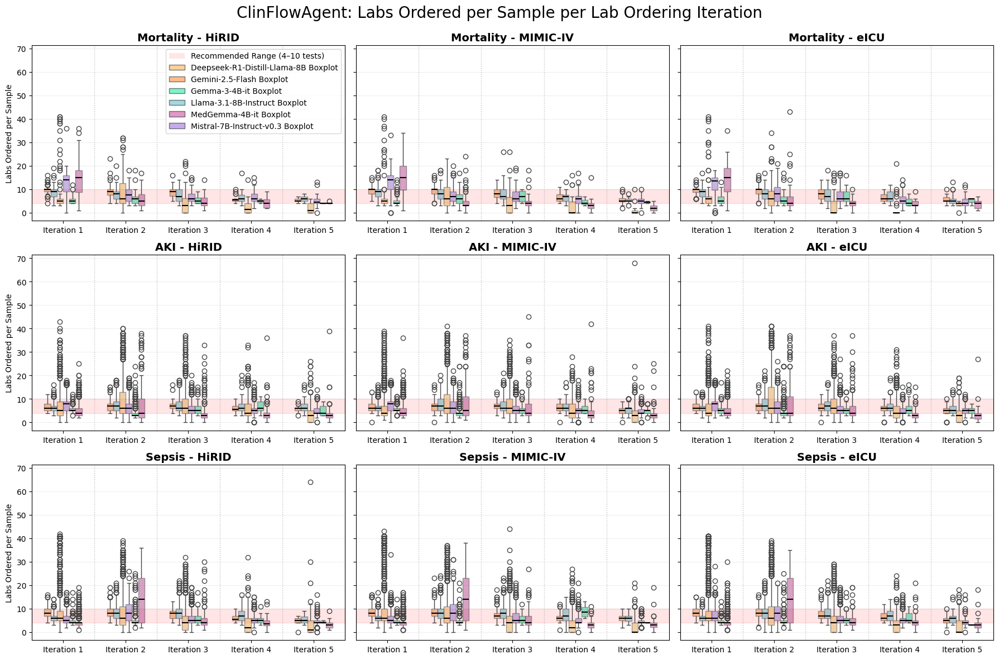

In [18]:
def plot_labs_ordered_per_step_grid_side_by_side(
    lab_order_df,
    get_model_color,
    tasks=None,
    datasets=None,
    max_steps=5,
    figsize=(18, 12),
    save_path=None
):
    """
    Plots a grid of boxplots showing the distribution of labs ordered per sample per lab ordering iteration,
    with models side by side for each iteration (using hue). Adds median lines for each model.
    """
    # Add this before calling plot_labs_ordered_per_step_grid_side_by_side
    if "num_labs_ordered" not in lab_order_df.columns:
        lab_order_df["num_labs_ordered"] = lab_order_df["requested_tests_list"].apply(len)

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]
    models_to_plot = sorted(lab_order_df["model"].unique())

    fig, axes = plt.subplots(len(tasks), len(datasets), figsize=figsize, sharey=True)
    fig.suptitle("ClinFlowAgent: Labs Ordered per Sample per Lab Ordering Iteration", fontsize=20, y=0.98)

    palette = {model: get_model_color(model) for model in models_to_plot}

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            panel = lab_order_df[(lab_order_df["task"] == task) & (lab_order_df["dataset"] == dataset)]
            if len(panel) == 0:
                ax.text(0.5, 0.5, f"No data for\n{task}-{dataset}", ha="center", va="center", transform=ax.transAxes, fontsize=12)
                ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
                continue
            # Plot boxplots with hue=model (side by side), increased transparency
            boxplot = sns.boxplot(
                x="lab_ordering_step",
                y="num_labs_ordered",
                hue="model",
                data=panel,
                ax=ax,
                palette=palette,
                showfliers=True,
                width=0.6,
                linewidth=1,
                boxprops=dict(alpha=0.5),
                medianprops=dict(color="black", linewidth=1.5),
            )
            # Add red background between y=4 and y=10
            ax.axhspan(4, 10, color="red", alpha=0.1, zorder=0)
            # Calculate the positions of each box for each model and step
            # Get the positions from the drawn artists
            # Each box is a PathPatch in ax.artists, order: for each step, all models
            n_models = len(models_to_plot)
            n_steps = max_steps
            # Get the order of steps and models as plotted
            step_order = sorted(panel["lab_ordering_step"].unique())
            model_order = models_to_plot
            # Build a mapping: (step, model) -> box center x
            box_positions = {}
            box_artists = [artist for artist in ax.artists if hasattr(artist, "get_x")]
            for idx, artist in enumerate(box_artists):
                # Calculate which step and model this box belongs to
                step_idx = idx // n_models
                model_idx = idx % n_models
                step = step_order[step_idx]
                model = model_order[model_idx]
                # Get box center
                x = artist.get_x() + artist.get_width() / 2
                box_positions[(step, model)] = x
            # Add median lines for each model using step index positions
            for model in models_to_plot:
                sub = panel[panel["model"] == model]
                medians = sub.groupby("lab_ordering_step")["num_labs_ordered"].median()
                # Use step indices as x positions
                xs = [
                    step_order.index(step)
                    for step in medians.index
                    if step in step_order
                ]
                ys = [medians[step] for step in medians.index if step in step_order]
                # ax.plot(
                #     xs,
                #     ys,
                #     color=get_model_color(model),
                #     marker="o",
                #     markersize=0.1,
                #     linewidth=2,
                #     alpha=0.9,
                #     label=f"{model} Median",
                # )
            ax.set_xticks(range(max_steps))
            ax.set_xticklabels([f"Iteration {s+1}" for s in range(max_steps)], rotation=0, fontsize=10)
            # Add vertical grid lines between xticks
            xticks = np.arange(max_steps)
            # Calculate midpoints between xticks
            midpoints = xticks[:-1] + 0.5
            for x in midpoints:
                ax.axvline(
                    x, color="gray", linestyle=":", linewidth=1, alpha=0.5, zorder=0
                )
            ax.set_xlabel("", fontsize=10)
            ax.set_ylabel("Labs Ordered per Sample" if j == 0 else "", fontsize=10)
            ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
            ax.grid(True, alpha=0.2, axis="y")
            if i == 0 and j == 0:
                legend_elements = [
                    Patch(
                        facecolor="red",
                        alpha=0.1,
                        label="Recommended Range (4–10 tests)",
                    ),
                ]
                # Add boxplot legend handles for each model
                for model in models_to_plot:
                    legend_elements.append(
                        Patch(
                            facecolor=get_model_color(model),
                            edgecolor="black",
                            alpha=0.5,
                            label=f"{model} Boxplot",
                        )
                    )
                # # Add median line legend handles for each model
                # for model in models_to_plot:
                #     legend_elements.append(
                #         plt.Line2D(
                #             [0],
                #             [0],
                #             color=get_model_color(model),
                #             linewidth=2,
                #             marker="o",
                #             markersize=6,
                #             label=f"{model} Median",
                #         )
                #     )
                ax.legend(handles=legend_elements, fontsize=10)
            else:
                ax.get_legend().remove()
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    if save_path is None:
        save_path = os.path.join(OUTPUT_BASE_DIR, "cwa_labs_ordered_per_iteration_grid_side_by_side.png")
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Labs ordered per iteration grid (side by side) plot saved to: {save_path}")
    plt.show()

# Call the updated function
plot_labs_ordered_per_step_grid_side_by_side(
    lab_order_df,
    get_model_color=get_model_color,
    tasks=["Mortality", "AKI", "Sepsis"],
    datasets=["HiRID", "MIMIC-IV", "eICU"],
    max_steps=5,
    figsize=(18, 12),
    save_path=None
)

In [19]:
# --- Improved actionable insights for lab ordering instruction adherence ---

lab_order_df["lab_ordering_step_valid"] = lab_order_df["num_labs_ordered"].between(
    4, 10
)
valid_stats = (
    lab_order_df.groupby(["model", "task", "dataset", "lab_ordering_step"])[
        "lab_ordering_step_valid"
    ]
    .mean()
    .reset_index()
    .rename(columns={"lab_ordering_step_valid": "pct_steps_followed_instruction"})
)

# 1. Summary table: mean % adherence per model across all steps/tasks/datasets
model_summary = (
    valid_stats.groupby("model")["pct_steps_followed_instruction"]
    .agg(["mean", "std", "min", "max", "count"])
    .sort_values("mean", ascending=False)
)
print("\nModel-level adherence summary (mean % steps following instruction):")
print(model_summary)

# 2. Stepwise adherence: which steps are most/least likely to follow instruction per model
stepwise_summary = (
    valid_stats.groupby(["model", "lab_ordering_step"])[
        "pct_steps_followed_instruction"
    ]
    .mean()
    .reset_index()
    .pivot(
        index="model",
        columns="lab_ordering_step",
        values="pct_steps_followed_instruction",
    )
)
print("\nStepwise adherence by model (columns = step):")
print(stepwise_summary)

# 3. Task-dataset breakdown: highlight lowest and highest adherence per model-task-dataset
lowest = (
    valid_stats.sort_values("pct_steps_followed_instruction").groupby("model").head(1)
)
highest = (
    valid_stats.sort_values("pct_steps_followed_instruction", ascending=False)
    .groupby("model")
    .head(1)
)
print("\nLowest adherence per model (task/dataset/step):")
print(
    lowest[
        [
            "model",
            "task",
            "dataset",
            "lab_ordering_step",
            "pct_steps_followed_instruction",
        ]
    ]
)
print("\nHighest adherence per model (task/dataset/step):")
print(
    highest[
        [
            "model",
            "task",
            "dataset",
            "lab_ordering_step",
            "pct_steps_followed_instruction",
        ]
    ]
)

# 4. Flag models or steps with <50% adherence for any task/dataset/step
flagged = valid_stats[valid_stats["pct_steps_followed_instruction"] < 0.5]
if not flagged.empty:
    print("\n⚠️ Steps with <50% adherence (potential concern):")
    print(
        flagged[
            [
                "model",
                "task",
                "dataset",
                "lab_ordering_step",
                "pct_steps_followed_instruction",
            ]
        ]
    )
else:
    print("\nAll steps have ≥50% adherence to lab ordering instruction.")

# --- Aggregated adherence insights per task ---
task_adherence_stats = (
    valid_stats.groupby("task")["pct_steps_followed_instruction"]
    .agg(["mean", "std"])
    .sort_values("mean", ascending=False)
)
print("\n=== Aggregated Adherence by Task (mean ± std) ===")
print(task_adherence_stats)
best_task = task_adherence_stats["mean"].idxmax()
print(
    f"\nBest task in terms of adherence: {best_task} ({task_adherence_stats.loc[best_task, 'mean']:.2%} ± {task_adherence_stats.loc[best_task, 'std']:.2%})"
)

# --- Aggregated adherence insights per step (iteration) ---
step_adherence_stats = (
    valid_stats.groupby("lab_ordering_step")["pct_steps_followed_instruction"]
    .agg(["mean", "std"])
    .sort_index()
)
print("\n=== Aggregated Adherence by Lab Ordering Step (mean ± std) ===")
print(step_adherence_stats)
best_step = step_adherence_stats["mean"].idxmax()
print(
    f"\nBest step (iteration) in terms of adherence: Step {best_step} ({step_adherence_stats.loc[best_step, 'mean']:.2%} ± {step_adherence_stats.loc[best_step, 'std']:.2%})"
)


Model-level adherence summary (mean % steps following instruction):
                                  mean       std       min       max  count
model                                                                      
Gemini-2.5-Flash              0.945312  0.045261  0.791209  1.000000     45
Llama-3.1-8B-Instruct         0.893277  0.048522  0.780000  1.000000     45
Gemma-3-4B-it                 0.832939  0.197565  0.000000  1.000000     45
Mistral-7B-Instruct-v0.3      0.703492  0.163486  0.130000  0.895522     45
Deepseek-R1-Distill-Llama-8B  0.471256  0.161542  0.172414  0.800000     45
MedGemma-4B-it                0.414921  0.154503  0.140000  1.000000     45

Stepwise adherence by model (columns = step):
lab_ordering_step                    1         2         3         4         5
model                                                                         
Deepseek-R1-Distill-Llama-8B  0.698410  0.505400  0.429899  0.354317  0.368252
Gemini-2.5-Flash              0.934937 

Lab ordering adherence grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_adherence_grid.png


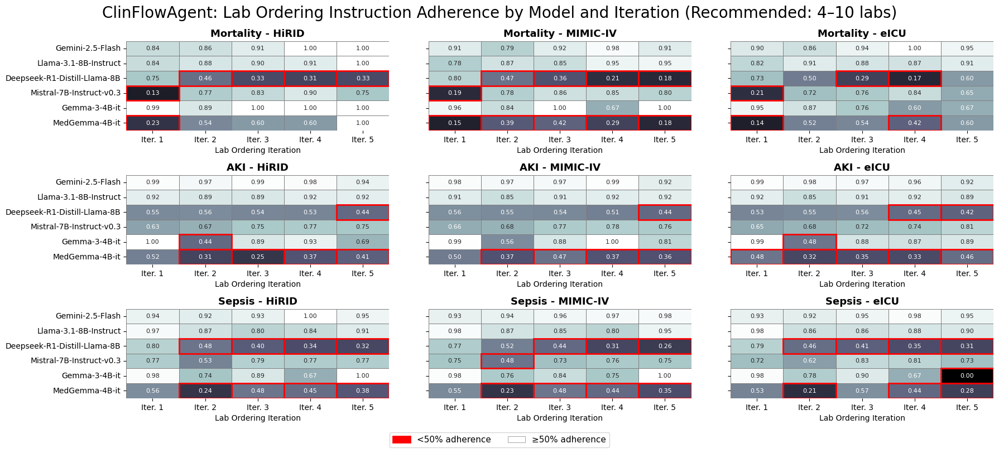

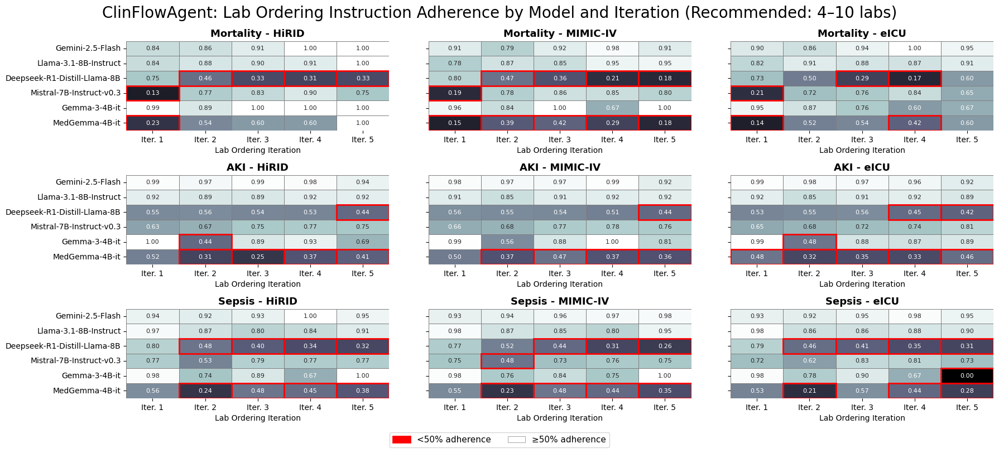

In [20]:
def plot_lab_ordering_adherence_grid(
    valid_stats,
    tasks=None,
    datasets=None,
    figsize=(18, 8),
    save_path=None,
    save_suffix="",
):
    """
    Plots a 3x3 grid (tasks x datasets) showing lab ordering instruction adherence (% steps with 4–10 labs ordered)
    for each model and step. Cells with <50% adherence are outlined in red for actionable review.
    Legend is placed below the grid.
    """

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]
    models = [m for m in LLM_MODELS if m in valid_stats["model"].unique()]
    max_steps = int(valid_stats["lab_ordering_step"].max())

    fig, axes = plt.subplots(len(tasks), len(datasets), figsize=figsize, sharey=True)
    fig.suptitle(
        "ClinFlowAgent: Lab Ordering Instruction Adherence by Model and Iteration (Recommended: 4–10 labs)",
        fontsize=20,
        y=0.98,
    )

    # Prepare legend elements (for below grid)
    legend_elements = [
        Patch(facecolor="red", edgecolor="red", label="<50% adherence", linewidth=2),
        Patch(
            facecolor="white", edgecolor="gray", label="≥50% adherence", linewidth=0.5
        ),
    ]

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            panel = valid_stats[
                (valid_stats["task"] == task) & (valid_stats["dataset"] == dataset)
            ]
            if len(panel) == 0:
                ax.text(
                    0.5,
                    0.5,
                    f"No data for\n{task}-{dataset}",
                    ha="center",
                    va="center",
                    transform=ax.transAxes,
                    fontsize=12,
                )
                ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
                continue
            grid = panel.pivot(
                index="model",
                columns="lab_ordering_step",
                values="pct_steps_followed_instruction",
            ).reindex(index=models)
            sns.heatmap(
                grid,
                ax=ax,
                annot=True,
                fmt=".2f",
                cmap="bone",
                vmin=0,
                vmax=1,
                cbar=False,
                linewidths=0.5,
                linecolor="gray",
                annot_kws={"fontsize": 8},
            )
            ax.set_title(f"{task} - {dataset}", fontsize=13, fontweight="bold")
            ax.set_xlabel("Lab Ordering Iteration", fontsize=10)
            ax.set_ylabel("" if j == 0 else "", fontsize=10)
            ax.set_xticklabels(
                [f"Iter. {s}" for s in grid.columns], rotation=0, fontsize=10
            )
            ax.set_yticklabels(grid.index, fontsize=10)
            ax.grid(False)
            # Highlight cells with <0.5 adherence
            for y, model in enumerate(grid.index):
                for x, step in enumerate(grid.columns):
                    val = grid.loc[model, step]
                    if val < 0.5:
                        ax.add_patch(
                            plt.Rectangle(
                                (x, y), 1, 1, fill=False, edgecolor="red", linewidth=2
                            )
                        )

    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.1, wspace=0.15, hspace=0.5)
    # Place legend below the grid, centered
    fig.legend(
        handles=legend_elements,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.02),
        fontsize=11,
        frameon=True,
        ncol=len(legend_elements),
    )
    if save_path is None:
        save_path = os.path.join(
            OUTPUT_BASE_DIR, f"cwa_lab_ordering_adherence_grid{save_suffix}.png"
        )
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"Lab ordering adherence grid plot saved to: {save_path}")
    return fig


# Call the function to plot the grid
plot_lab_ordering_adherence_grid(valid_stats)

### Analysis of Total Labs Requested

True waterfall grid plot saved to: ./notebook_output/pulse_agents_clinflowagent/cwa_lab_ordering_true_waterfall_grid.png


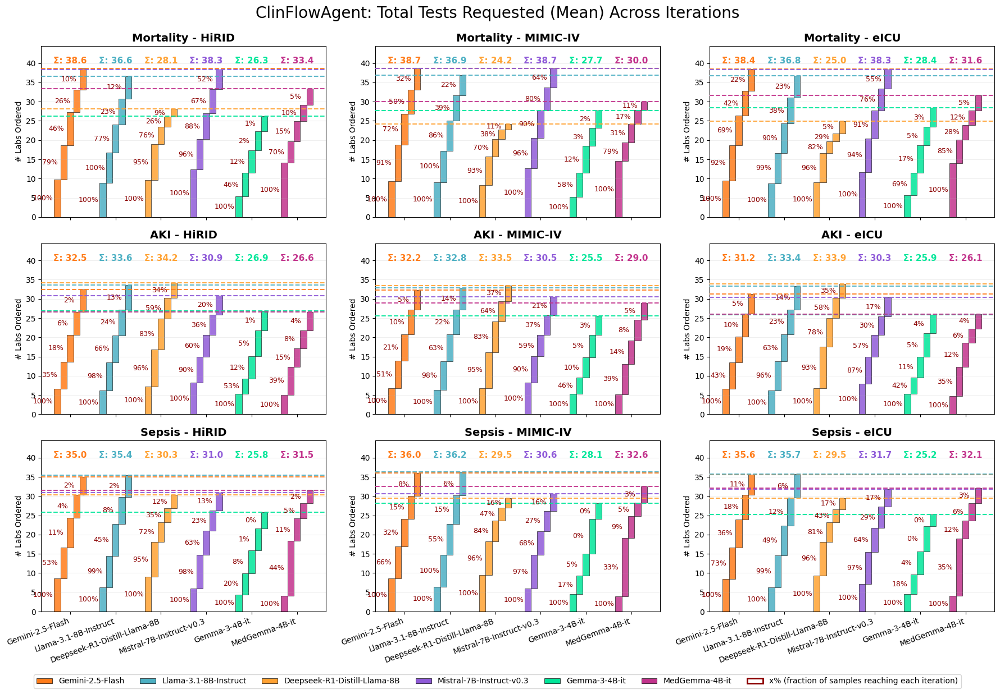


Interpretation:
Each panel shows, for each model (x-axis), the mean number of labs ordered per step (waterfall bars).
Bar heights represent the mean labs ordered for that step, including zeros for samples without that iteration.
Percentages inside bars show the fraction of samples that reached each step (iteration).
The annotation above each waterfall shows the mean total labs ordered per sample for that model-task-dataset (one decimal place, aligned).
Horizontal dashed lines indicate the total labs ordered for each model.


In [21]:
def plot_lab_ordering_true_waterfall_grid(
    lab_order_df,
    get_model_color,
    tasks=None,
    datasets=None,
    max_steps=5,
    figsize=(18, 12),
    save_path=None,
    save_suffix="",
):
    """
    Plots a 3x3 grid (tasks x datasets) of true waterfall plots:
    For each model, show 5 bars (steps 1–5) next to each other, each bar starts at the cumulative sum of previous steps.
    X-axis: models, grouped bars for steps per model.
    - Removes recommended range background and legend.
    - Xticks and xticklabels are aligned.
    - Annotates total labs ordered above each waterfall in model color.
    - Annotates percentage of samples per bar inside the bar.
    - Adds y-axis padding so total labs annotations are always visible and aligned.
    """

    if tasks is None:
        tasks = ["Mortality", "AKI", "Sepsis"]
    if datasets is None:
        datasets = ["HiRID", "MIMIC-IV", "eICU"]
    models = [m for m in LLM_MODELS if m in lab_order_df["model"].unique()]

    fig, axes = plt.subplots(len(tasks), len(datasets), figsize=figsize)
    fig.suptitle(
        "ClinFlowAgent: Total Tests Requested (Mean) Across Iterations", fontsize=20, y=0.98
    )

    # Determine the global max total labs for annotation alignment
    global_max_total_labs = 0
    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            panel = lab_order_df[
                (lab_order_df["task"] == task) & (lab_order_df["dataset"] == dataset)
            ]
            for model in models:
                sub = panel[panel["model"] == model]
                if len(sub) == 0:
                    continue
                pivot = sub.pivot_table(
                    index="sample_index",
                    columns="lab_ordering_step",
                    values="num_labs_ordered",
                    aggfunc="first",
                )
                for step in range(1, max_steps + 1):
                    if step not in pivot.columns:
                        pivot[step] = 0
                pivot = pivot[[step for step in range(1, max_steps + 1)]]
                total_labs = np.sum(pivot.mean(axis=0).values)
                if total_labs > global_max_total_labs:
                    global_max_total_labs = total_labs

    # Add padding for annotation (10% above global max)
    annotation_y = global_max_total_labs * 1.15

    for i, task in enumerate(tasks):
        for j, dataset in enumerate(datasets):
            ax = axes[i, j]
            panel = lab_order_df[
                (lab_order_df["task"] == task) & (lab_order_df["dataset"] == dataset)
            ]
            if len(panel) == 0:
                ax.text(
                    0.5,
                    0.5,
                    f"No data for\n{task}-{dataset}",
                    ha="center",
                    va="center",
                    transform=ax.transAxes,
                    fontsize=12,
                )
                ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
                continue

            bar_width = 0.12
            group_gap = 0.25
            x_positions = []
            x_labels = []
            top_y_by_model = {}
            xpos_by_model = {}
            for m_idx, model in enumerate(models):
                sub = panel[panel["model"] == model]
                if len(sub) == 0:
                    continue
                pivot = sub.pivot_table(
                    index="sample_index",
                    columns="lab_ordering_step",
                    values="num_labs_ordered",
                    aggfunc="first",
                )
                for step in range(1, max_steps + 1):
                    if step not in pivot.columns:
                        pivot[step] = 0
                pivot = pivot[[step for step in range(1, max_steps + 1)]]
                means = pivot.mean(axis=0).values
                starts = np.cumsum([0] + list(means[:-1]))
                xpos_base = m_idx * (max_steps * bar_width + group_gap)
                xpos_by_model[model] = []
                n_samples_total = pivot.shape[0]
                for s in range(max_steps):
                    xpos = xpos_base + s * bar_width
                    xpos_by_model[model].append(xpos)
                    # Percentage of samples with this iteration
                    n_samples_with_step = (~pivot.iloc[:, s].isna()).sum()
                    pct_samples = (
                        (n_samples_with_step / n_samples_total * 100)
                        if n_samples_total > 0
                        else 0
                    )
                    bar = ax.bar(
                        xpos,
                        means[s],
                        bottom=starts[s],
                        width=bar_width,
                        color=get_model_color(model),
                        edgecolor="black",
                        linewidth=0.5,
                        alpha=0.85,
                        label=f"{model}" if s == 0 else None,
                    )
                    # Annotate percentage inside bar
                    if means[s] > 0:
                        ax.text(
                            xpos - bar_width * 2.2,
                            starts[s] + means[s] / 2,
                            f"{pct_samples:.0f}%",
                            ha="center",
                            va="center",
                            fontsize=9,
                            color="darkred",
                            zorder=11,
                        )
                    if s == 2:
                        x_positions.append(xpos)
                        x_labels.append(model)
                # Store top_y for this model
                top_y_by_model[model] = np.sum(means)

            # --- Draw horizontal lines for each model after axis limits are set ---
            ax.set_ylabel("# Labs Ordered", fontsize=10)
            ax.set_title(f"{task} - {dataset}", fontsize=14, fontweight="bold")
            ax.grid(True, alpha=0.2, axis="y")

            # Set xticks and xticklabels exactly below the bars (centered)
            xtick_positions = []
            xtick_labels = []
            for model in models:
                if model in xpos_by_model and len(xpos_by_model[model]) > 0:
                    # Center tick under the middle bar (step 3)
                    xtick_positions.append(xpos_by_model[model][2])
                    xtick_labels.append(model)
            ax.set_xticks(xtick_positions)
            ax.set_xticklabels(xtick_labels, fontsize=10, rotation=0, ha="center")

            # Set y-axis limit to accommodate annotation
            ax.set_ylim(0, annotation_y)

            # Draw horizontal dashed lines and aligned annotation for each model
            for model in top_y_by_model:
                ax.axhline(
                    y=top_y_by_model[model],
                    color=get_model_color(model),
                    linewidth=1.5,
                    linestyle="--",
                    alpha=0.9,
                    zorder=10,
                )
                # Annotate total labs ordered above the waterfall, all at annotation_y
                if model in xpos_by_model:
                    xpos_center = np.mean(xpos_by_model[model])
                    ax.text(
                        xpos_center,
                        annotation_y - 5,  # small offset below top
                        f"Σ: {top_y_by_model[model]:.1f}",
                        ha="center",
                        va="bottom",
                        fontsize=11,
                        color=get_model_color(model),
                        fontweight="bold",
                        zorder=12,
                    )

    # After plotting all panels, add legend below the grid
    if True:  # Only once, after all axes
        legend_elements = []
        for model in models:
            legend_elements.append(
                Patch(
                    facecolor=get_model_color(model),
                    edgecolor="black",
                    linewidth=0.5,
                    label=model,
                )
            )
        legend_elements.append(
            Patch(
                facecolor="none",
                edgecolor="darkred",
                linewidth=2,
                label="x% (fraction of samples reaching each iteration)",
            )
        )
        # Place legend below the grid, centered, with multiple columns
        fig.legend(
            handles=legend_elements,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.04),
            fontsize=10,
            frameon=True,
            ncol=len(models) + 1,
        )

    # Only show xticklabels for last row, rotated 30 degrees
    for i, ax_row in enumerate(axes):
        for j, ax in enumerate(ax_row if hasattr(ax_row, "__iter__") else [ax_row]):
            if i == len(axes) - 1:
                ax.set_xticklabels(ax.get_xticklabels(), rotation=20, ha="right", fontsize=10)
            else:
                ax.set_xticklabels([])

    plt.tight_layout()
    plt.subplots_adjust(top=0.92, bottom=0.08)
    if save_path is None:
        save_path = os.path.join(
            OUTPUT_BASE_DIR, f"cwa_lab_ordering_true_waterfall_grid{save_suffix}.png"
        )
    plt.savefig(save_path, dpi=400, bbox_inches="tight")
    print(f"True waterfall grid plot saved to: {save_path}")
    plt.show()
    return fig

# Call the function to plot the grid
plot_lab_ordering_true_waterfall_grid(
    lab_order_df,
    get_model_color=get_model_color,
    tasks=["Mortality", "AKI", "Sepsis"],
    datasets=["HiRID", "MIMIC-IV", "eICU"],
    max_steps=5,
    figsize=(18, 12),
    save_path=None,
)

print(
    "\nInterpretation:\n"
    "Each panel shows, for each model (x-axis), the mean number of labs ordered per step (waterfall bars).\n"
    "Bar heights represent the mean labs ordered for that step, including zeros for samples without that iteration.\n"
    "Percentages inside bars show the fraction of samples that reached each step (iteration).\n"
    "The annotation above each waterfall shows the mean total labs ordered per sample for that model-task-dataset (one decimal place, aligned).\n"
    "Horizontal dashed lines indicate the total labs ordered for each model."
)